In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

## Read in the full dataset

In [21]:
df_all = pd.read_csv('data/gun_data_all.csv',parse_dates=True)

In [23]:
df_all.head()

,date,state,gtrend,totals,urban_pop_percent,rural_pop_percent,year,population,percent_in_poverty,Median income,Standard error,partisan_index_dem,partisan_index_rep,month,percent_of_unemployed_poulation
0,2013-08-01,Alabama,58.208955,49978,59.0,41.0,2013,4831586,18.9,52690,2947,0.371084,0.628916,8,7.3
1,2013-08-01,Alaska,67.164179,7545,66.0,34.0,2013,737626,10.1,77840,4203,NaN,NaN,8,7.0
2,2013-08-01,Arizona,40.298507,29065,89.8,10.2,2013,6634690,18.6,64430,6151,0.457421,0.542579,8,7.8
3,2013-08-01,Arkansas,46.268657,22401,56.2,43.8,2013,2960459,19.4,50830,3042,0.485670,0.514330,8,7.1
4,2013-08-01,California,30.487805,111132,95.0,5.0,2013,38253768,16.8,73240,1557,0.605694,0.394306,8,8.9


## Alabama

In [349]:
df_f = df_all[df_all['state'] == 'Alabama']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

In [351]:
df_f.head()

,date,state,gtrend,totals,urban_pop_percent,rural_pop_percent,year,population,percent_in_poverty,Median income,Standard error,partisan_index_dem,partisan_index_rep,month,percent_of_unemployed_poulation
0,2013-08-01,Alabama,58.208955,49978,59.0,41.0,2013,4831586,18.9,52690,2947,0.371084,0.628916,8,7.3
51,2013-09-01,Alabama,44.776119,46263,59.0,41.0,2013,4831586,18.9,52690,2947,0.371084,0.628916,9,7.3
102,2013-10-01,Alabama,46.268657,51520,59.0,41.0,2013,4831586,18.9,52690,2947,0.371084,0.628916,10,7.2
153,2013-11-01,Alabama,53.731343,59213,59.0,41.0,2013,4831586,18.9,52690,2947,0.371084,0.628916,11,7.2
204,2013-12-01,Alabama,56.716418,77374,59.0,41.0,2013,4831586,18.9,52690,2947,0.371084,0.628916,12,7.2


In [353]:
df.head()

,totals
date,
2013-08-01,49978
2013-09-01,46263
2013-10-01,51520
2013-11-01,59213
2013-12-01,77374


Visualize the time series data for selected state

<Axes: xlabel='date'>

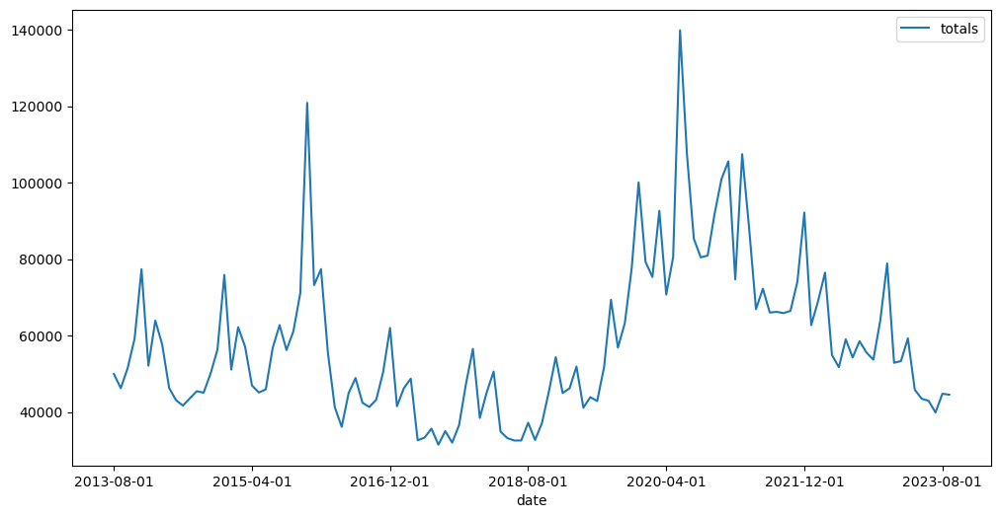

In [355]:
df.plot(figsize=(12,6))

In [91]:
len(df)

122

Train-test split where data in last 12 months was assigned to test set and all previous data was assigned to training set

In [357]:
train = df.iloc[:110]
test = df.iloc[110:]

Scale the data for better suit into neural network

In [359]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [361]:
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [99]:
scaled_train[:10]

array([[0.17070268],
       [0.13643115],
       [0.18492791],
       [0.25589719],
       [0.42343564],
       [0.19062906],
       [0.29956918],
       [0.24153359],
       [0.13706769],
       [0.10735339]])

In [103]:
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

In [363]:
# define generator
n_input = 12
n_features = 1
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

Build the model

In [123]:
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Input

In [369]:
model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [145]:
model.summary()

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_3 (LSTM)                   │ (None, 100)            │        40,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1)              │           101 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 40,901 (159.77 KB)

 Trainable params: 40,901 (159.77 KB)

 Non-trainable params: 0 (0.00 B)

In [371]:
# fit model
model.fit(generator,epochs=100)

Epoch 1/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0444  
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0368
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0356
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0210
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0320
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0163
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0285   
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0166
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0188
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0153   
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0339   
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0177
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0198
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152   
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - los

Plot the loss curve to determine further tunning of the model or not

In [ ]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [375]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


In [377]:
test_predictions

[array([0.25992826], dtype=float32),
 array([0.26919717], dtype=float32),
 array([0.37444937], dtype=float32),
 array([0.2736697], dtype=float32),
 array([0.4517793], dtype=float32),
 array([0.5401788], dtype=float32),
 array([0.5490073], dtype=float32),
 array([0.5379846], dtype=float32),
 array([0.63650393], dtype=float32),
 array([0.6558411], dtype=float32),
 array([0.70834726], dtype=float32),
 array([0.7111504], dtype=float32)]

Compare the predictions with true values

In [379]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

<Axes: xlabel='date'>

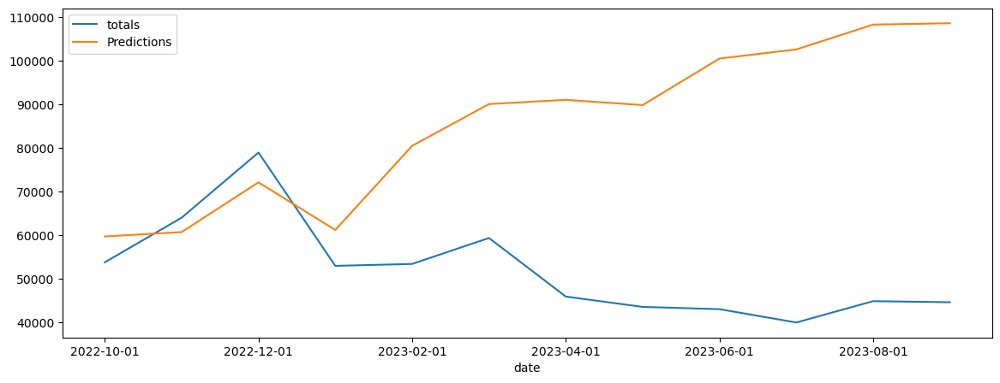

In [381]:
test.plot(figsize=(14,5))

In [383]:
from sklearn.metrics import mean_squared_error
from math import sqrt
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)

42205.823703367736


In [387]:
rmse_data = []

rmse_data.append({'State': 'Alabama', 'RMSE': rmse})

## Alaska

In [390]:
df_f = df_all[df_all['state'] == 'Alaska']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

In [392]:
df.head()

,totals
date,
2013-08-01,7545
2013-09-01,6047
2013-10-01,8322
2013-11-01,6868
2013-12-01,7951


<Axes: xlabel='date'>

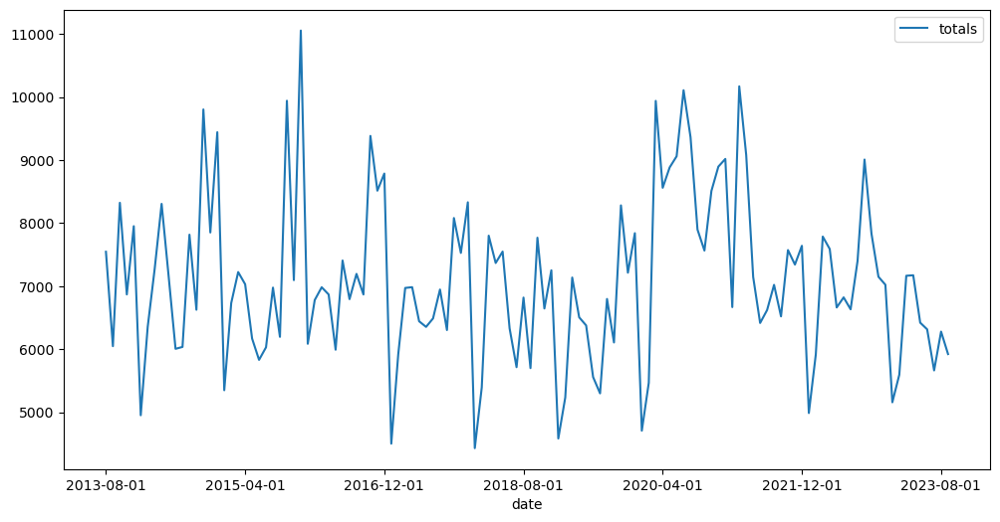

In [394]:
df.plot(figsize=(12,6))

In [396]:
train = df.iloc[:110]
test = df.iloc[110:]

In [398]:
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [400]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

In [402]:
model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [404]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0875 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0408
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0332   
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0481
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0560
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0411
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0291
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0412
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0427  
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0444
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0449
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0431
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0441
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0367
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0378
Epoch 16/1

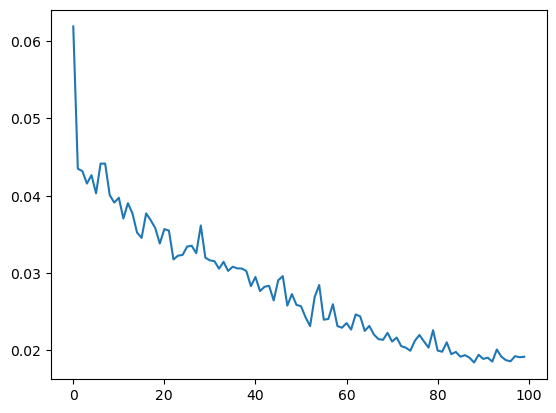

In [406]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [408]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


In [410]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

<Axes: xlabel='date'>

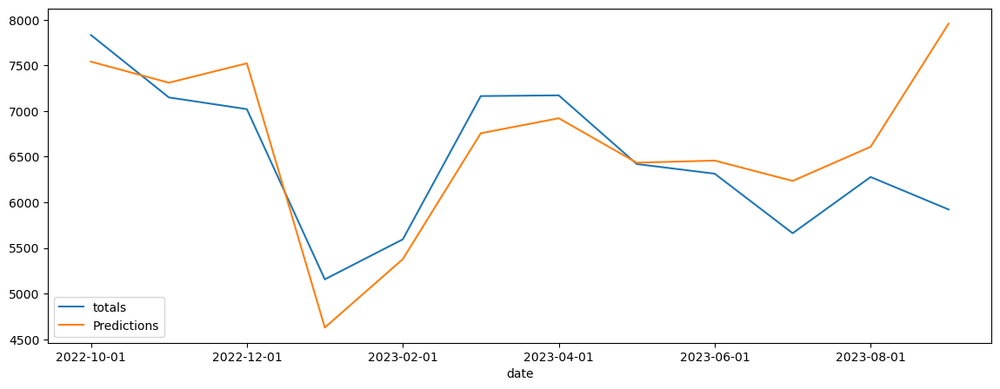

In [412]:
test.plot(figsize=(14,5))

In [414]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)

678.0876203816571


In [416]:
rmse_data.append({'State': 'Alaska', 'RMSE': rmse})

## Arizona

In [419]:
df_f = df_all[df_all['state'] == 'Arizona']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

In [421]:
df.head()

,totals
date,
2013-08-01,29065
2013-09-01,22904
2013-10-01,24148
2013-11-01,26839
2013-12-01,32374


<Axes: xlabel='date'>

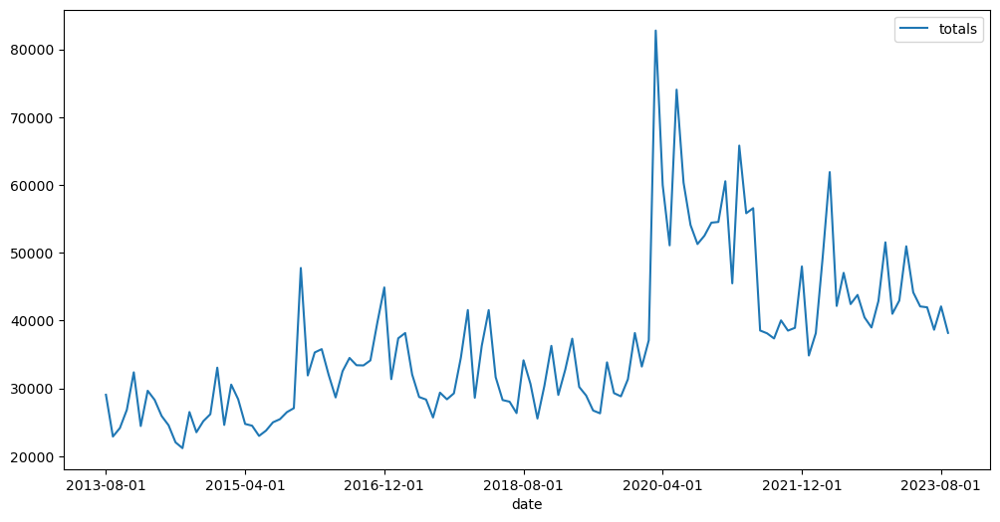

In [423]:
df.plot(figsize=(12,6))

In [425]:
train = df.iloc[:110]
test = df.iloc[110:]

In [427]:
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [429]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

In [431]:
model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [433]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0420  
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0212
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0189
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0146
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0322
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0257   
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0108
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0213
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0176
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0170  
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0103  
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0156
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0162
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0129
Epoch 1

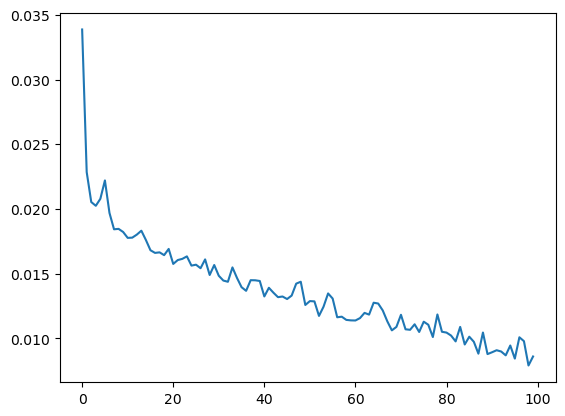

In [434]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [437]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


In [439]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

<Axes: xlabel='date'>

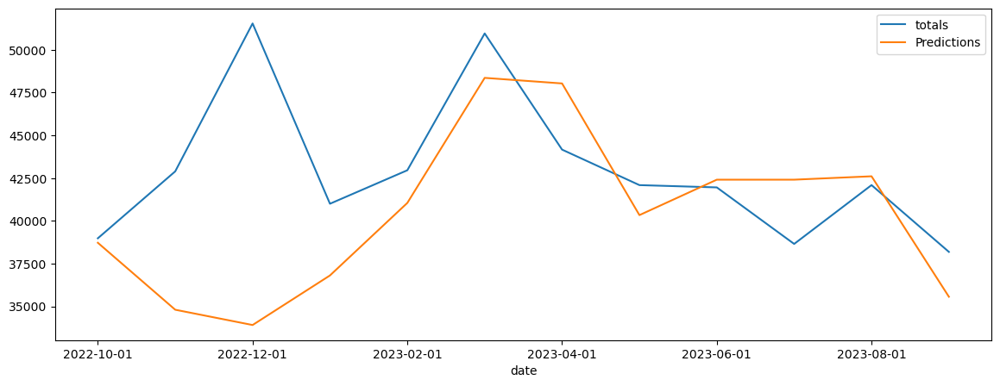

In [441]:
test.plot(figsize=(14,5))

In [443]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)

6080.160276200886


In [445]:
rmse_data.append({'State': 'Arizona', 'RMSE': rmse})

## Arkansas

In [448]:
df_f = df_all[df_all['state'] == 'Arkansas']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

<Axes: xlabel='date'>

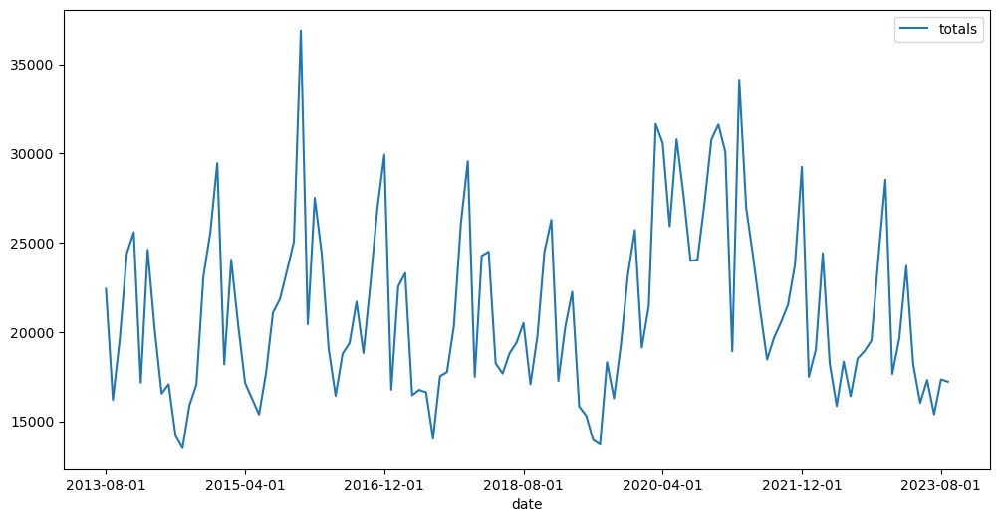

In [450]:
df.plot(figsize=(12,6))

In [452]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [454]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [456]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0732  
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0504
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0518
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0375
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0341
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0390
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0358
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0379
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0307
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0362   
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0352
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0318
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0242
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0232  
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0354
Epoch 16/

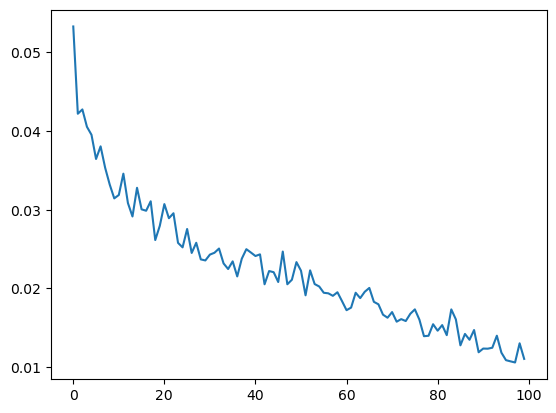

In [458]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [460]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


<Axes: xlabel='date'>

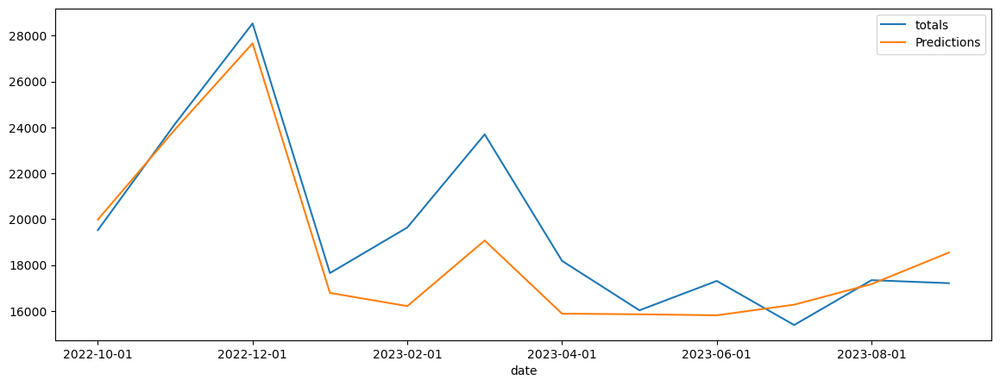

In [462]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [464]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)

1937.9597491774023


In [466]:
rmse_data.append({'State': 'Arkansas', 'RMSE': rmse})

## California

<Axes: xlabel='date'>

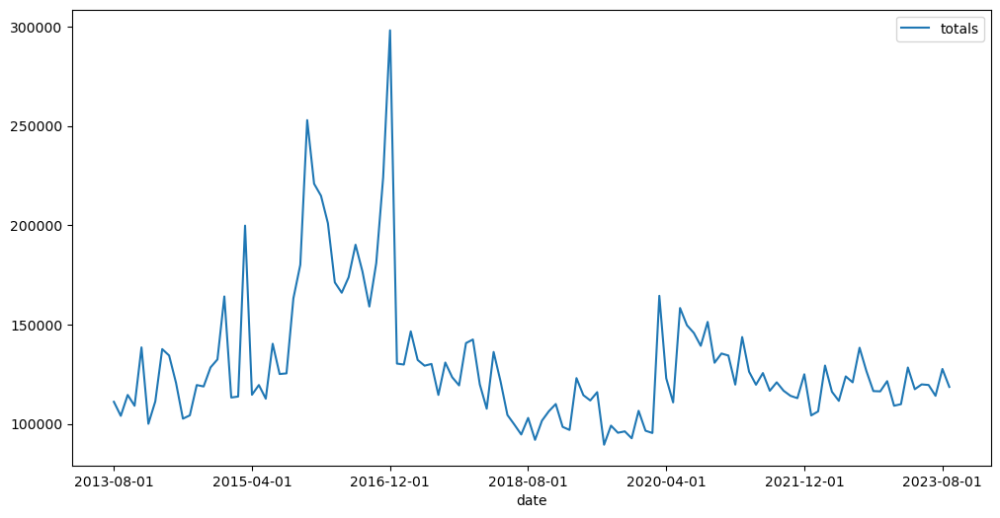

In [471]:
df_f = df_all[df_all['state'] == 'California']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [473]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [475]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [477]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0325 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0171
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0210
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0167
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0154
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0129
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0161
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0253
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0116
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0173
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0160
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0113
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0108
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0231   
Epoch 16/100

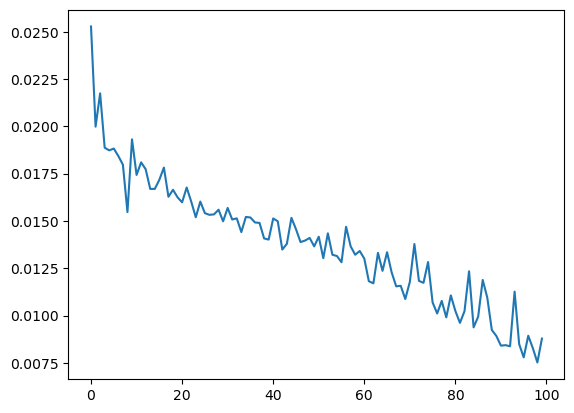

In [479]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [481]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


<Axes: xlabel='date'>

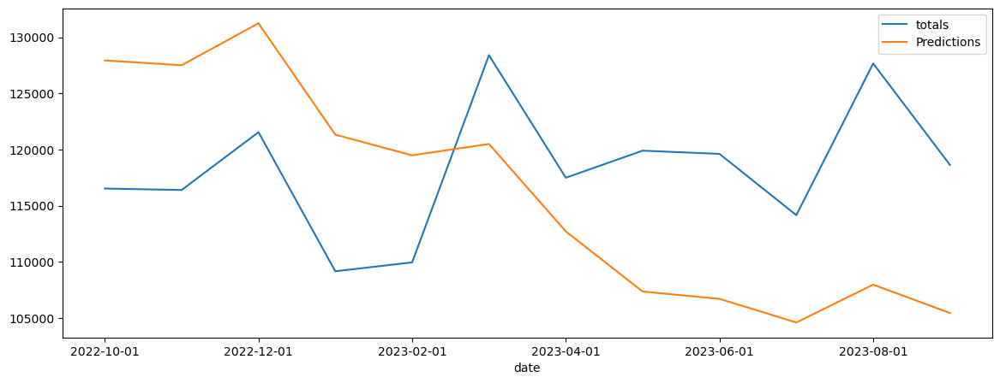

In [483]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [485]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)

11721.483008227335


In [487]:
rmse_data.append({'State': 'California', 'RMSE': rmse})

## Colorado

<Axes: xlabel='date'>

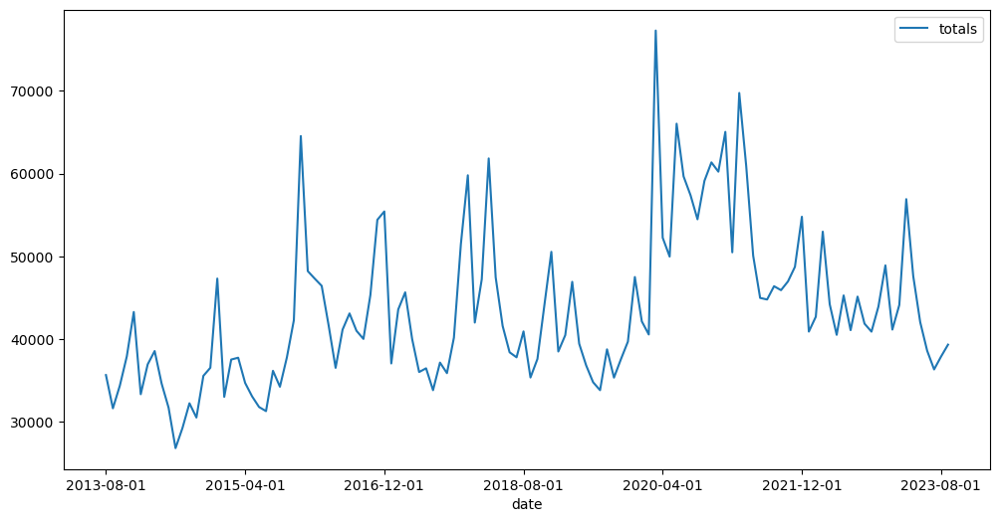

In [490]:
df_f = df_all[df_all['state'] == 'Colorado']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [492]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [494]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [496]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0743 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0270
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0295
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0403
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0179
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0213
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0183
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0171
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0233
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0184
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0247
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0182
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0232  
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0244
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140
Epoch 16/100


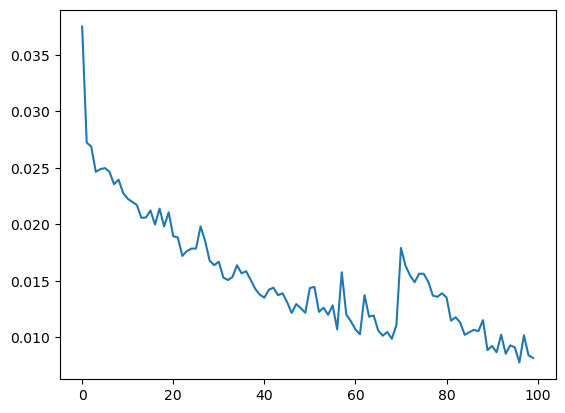

In [498]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [500]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


<Axes: xlabel='date'>

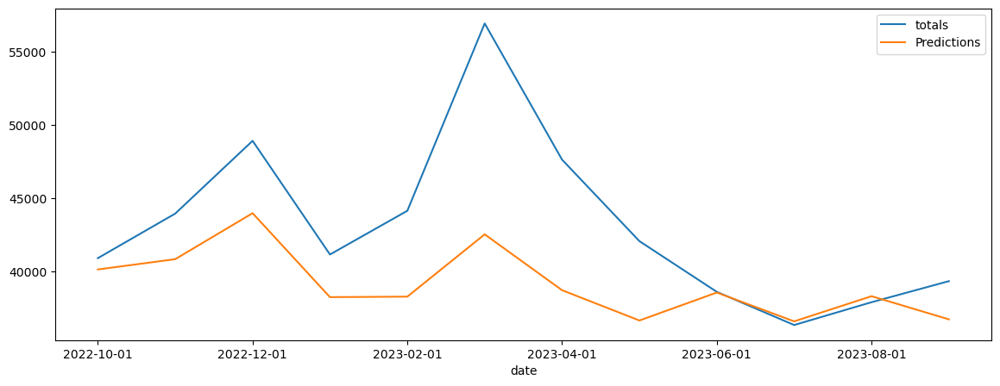

In [502]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [504]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)

5778.623159576874


In [506]:
rmse_data.append({'State': 'Colorado', 'RMSE': rmse})

## Connecticut

<Axes: xlabel='date'>

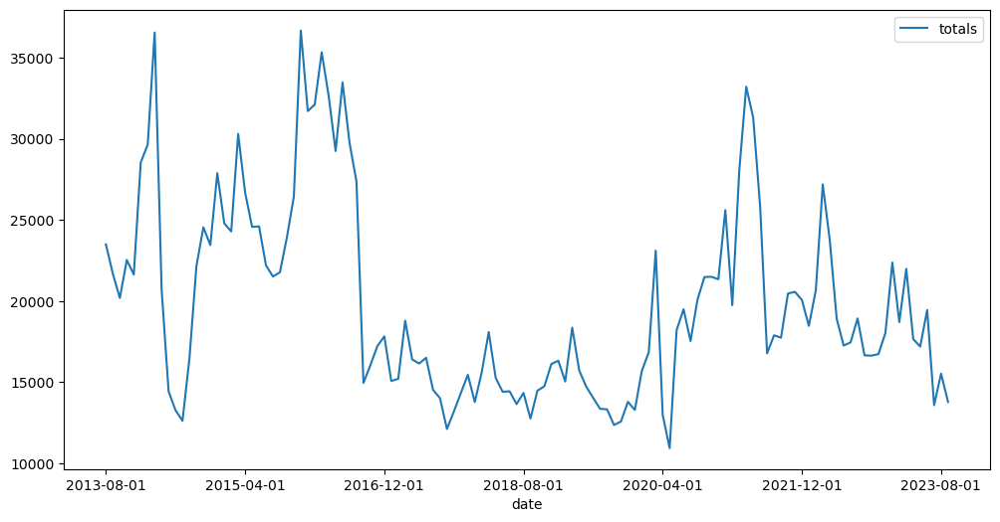

In [509]:
df_f = df_all[df_all['state'] == 'Connecticut']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [511]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [513]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [515]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1353 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0396
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0334
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0345
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0331
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0363
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0267
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0397
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0288
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0203
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0185
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0303
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0197
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0228
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0278
Epoch 16/100
98

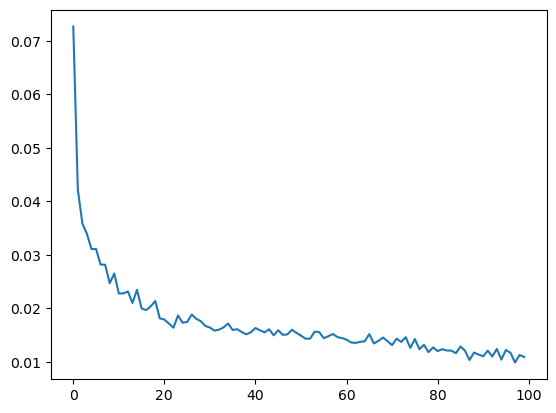

In [517]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [519]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


<Axes: xlabel='date'>

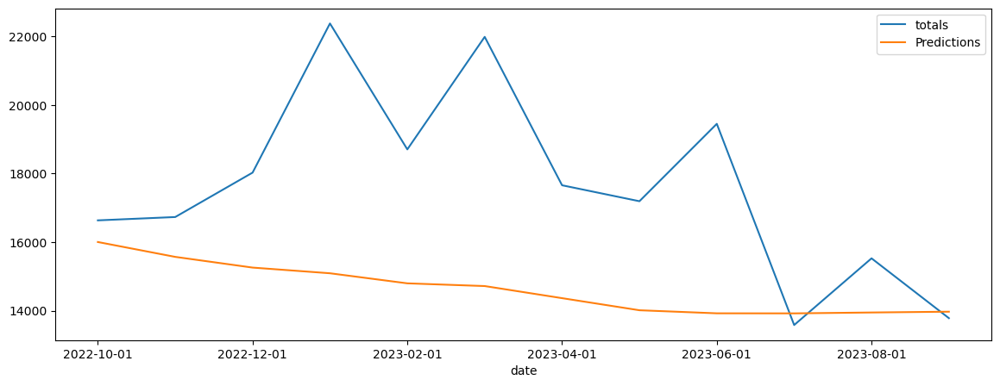

In [521]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [523]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)

3921.6663386237574


In [525]:
rmse_data.append({'State': 'Connecticut', 'RMSE': rmse})

## Delaware

<Axes: xlabel='date'>

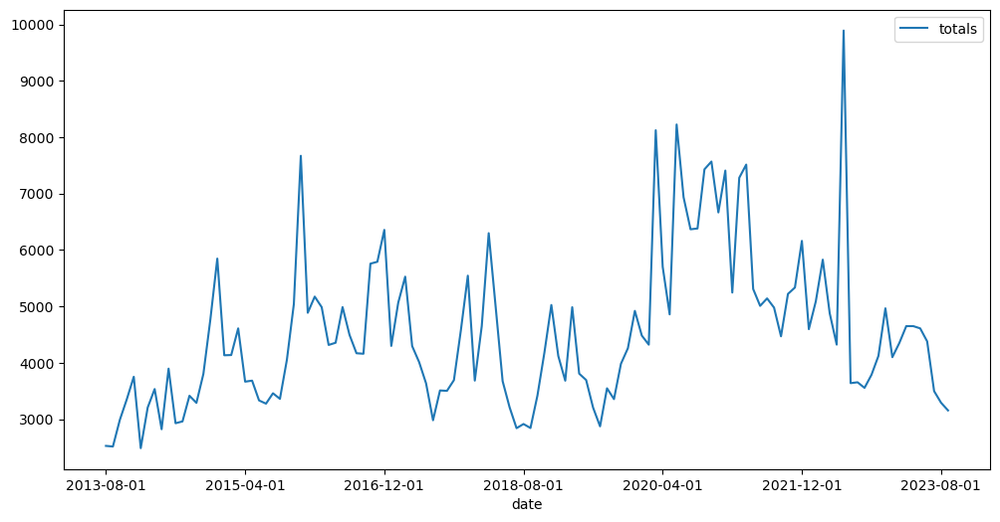

In [528]:
df_f = df_all[df_all['state'] == 'Delaware']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [530]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [532]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [534]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0467 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0275
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0215
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0257
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0183
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0267
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0215
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0272  
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0213
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0412
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0217
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0187
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0283  
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0213
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0188
Epoch 16/10

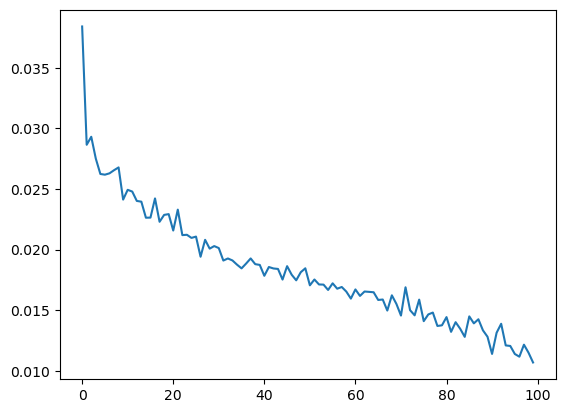

In [536]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [538]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


<Axes: xlabel='date'>

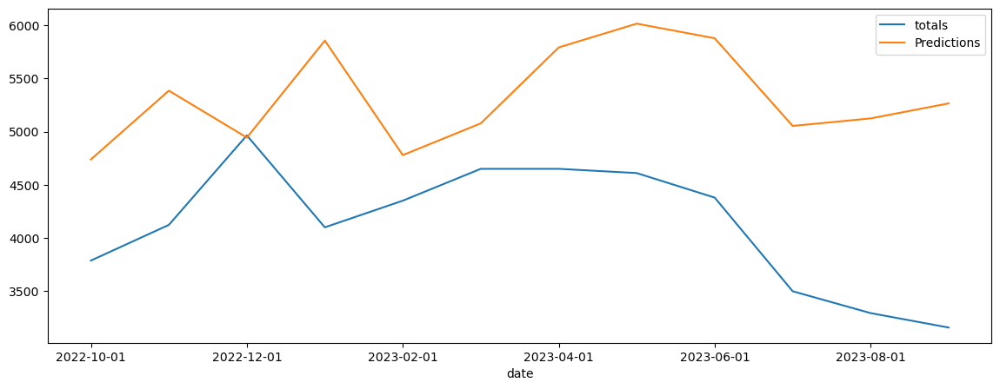

In [540]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [542]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)

1346.3986807287383


In [544]:
rmse_data.append({'State': 'Delware', 'RMSE': rmse})

## District of Columbia

<Axes: xlabel='date'>

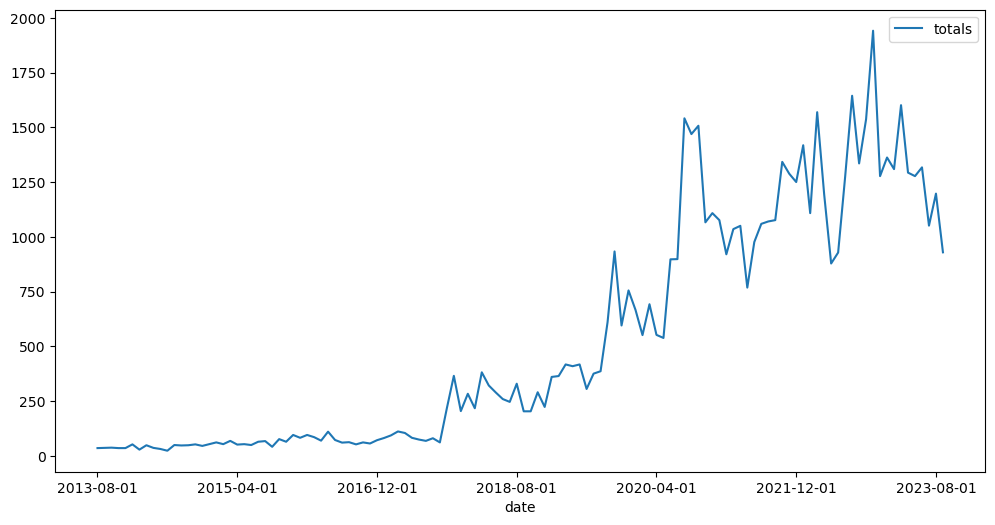

In [547]:
df_f = df_all[df_all['state'] == 'District of Columbia']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [549]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [551]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [553]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0695  
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0104  
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0121
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0121
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0108  
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0121
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0096  
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0124
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0116
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0116
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0103
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0140
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0132
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0098
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0168
Epoch 16

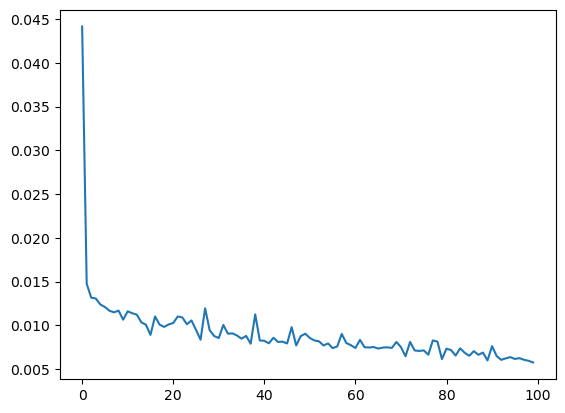

In [555]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [557]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


<Axes: xlabel='date'>

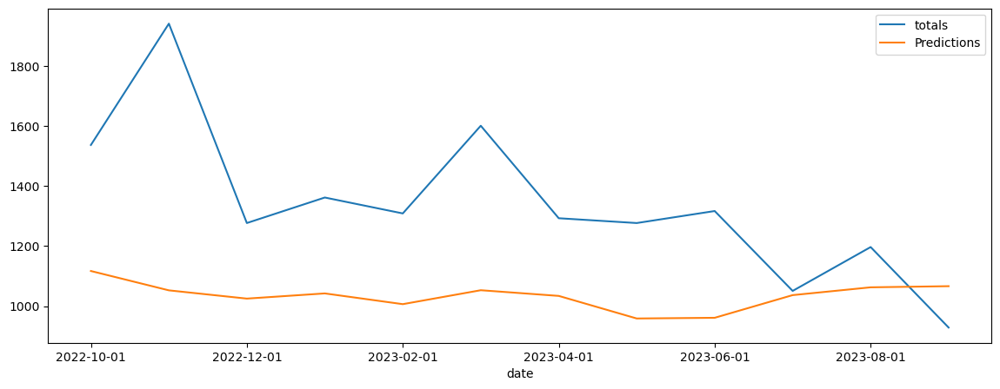

In [559]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [561]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)

392.9576309621891


In [563]:
rmse_data.append({'State': 'District of Columbia', 'RMSE': rmse})

## Florida

<Axes: xlabel='date'>

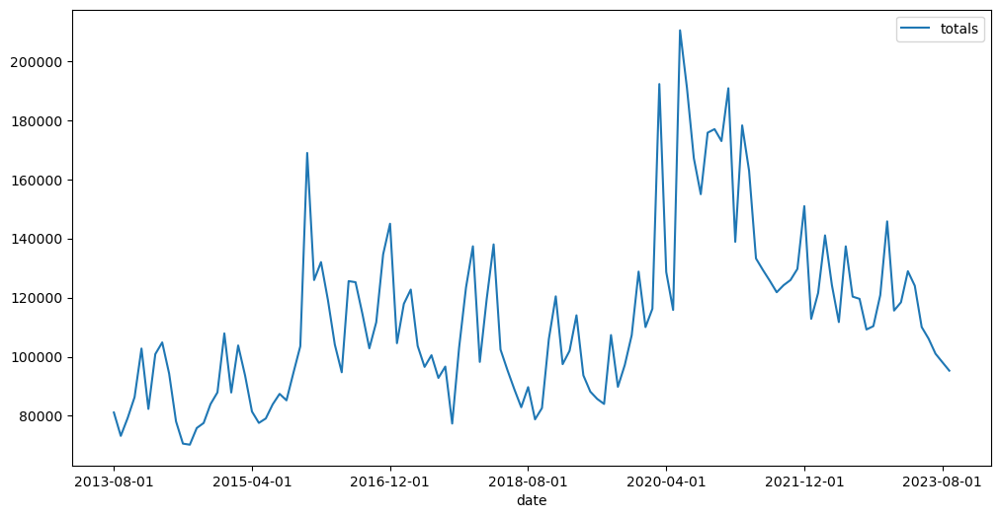

In [566]:
df_f = df_all[df_all['state'] == 'Florida']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [568]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [570]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [572]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0886  
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0295
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0224
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0209
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0245  
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0222   
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0241  
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0257
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0241
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0195
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0194
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0307
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0231  
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0192
Epoch

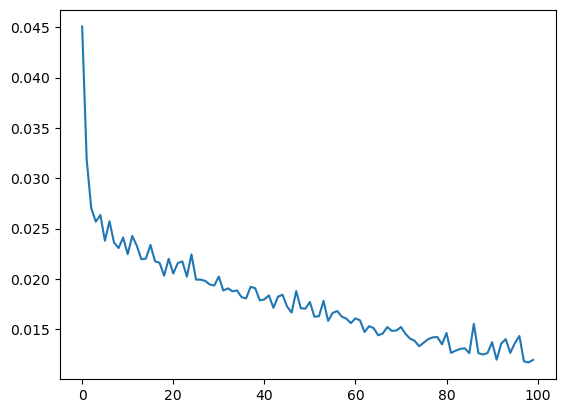

In [574]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [576]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


<Axes: xlabel='date'>

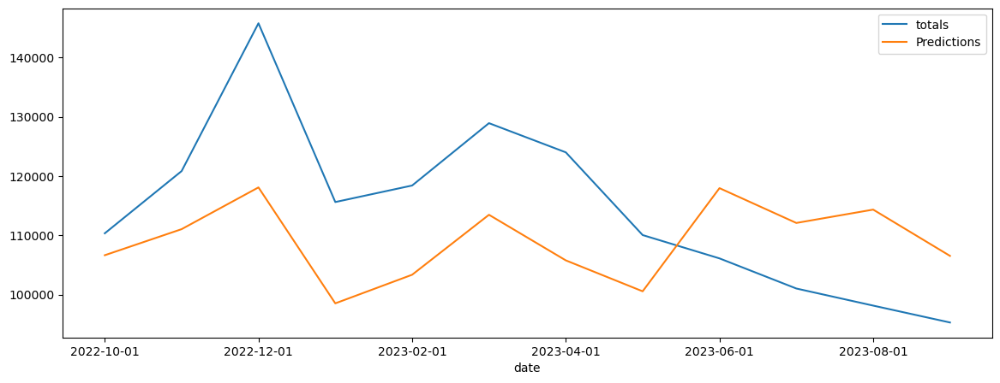

In [578]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [580]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Florida', 'RMSE': rmse})

15028.839178828186


## Georgia

<Axes: xlabel='date'>

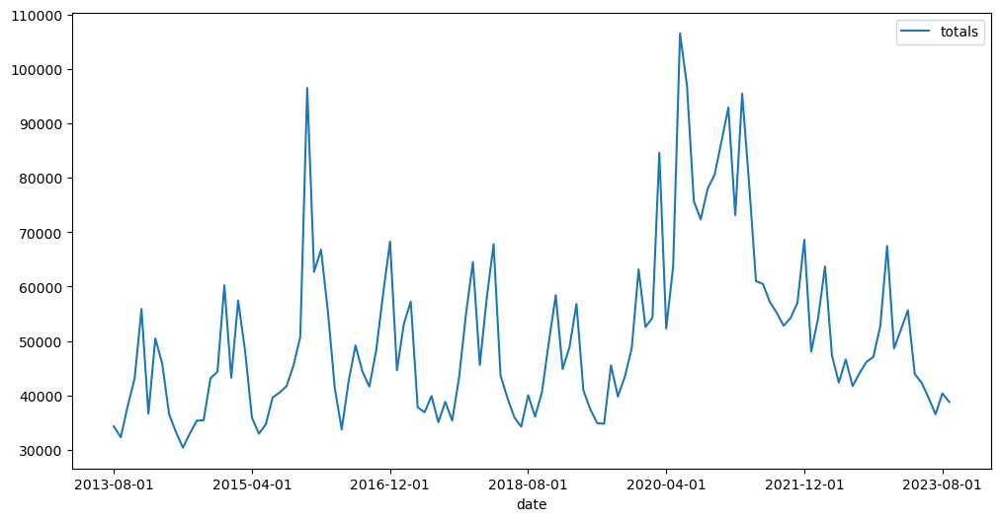

In [583]:
df_f = df_all[df_all['state'] == 'Georgia']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [585]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [587]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [589]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0569 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0326
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0340
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0293
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0261
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0243
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0189
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0292
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0161
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0377
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0206  
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0231
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0375
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0230
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0154
Epoch 16/100


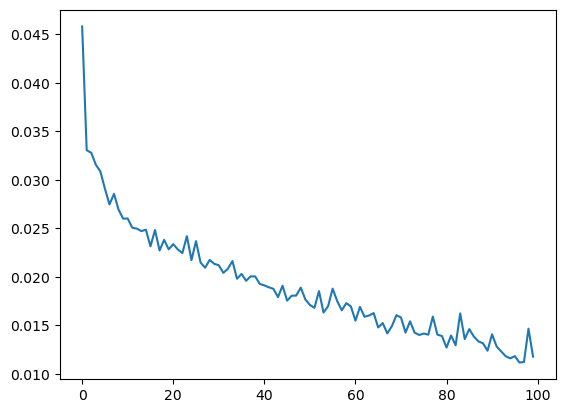

In [591]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [593]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


<Axes: xlabel='date'>

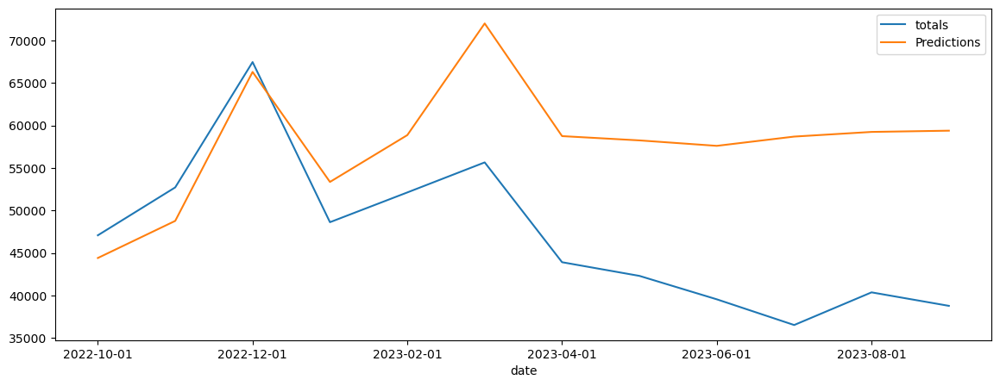

In [597]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [599]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Georgia', 'RMSE': rmse})

14225.237464542188


## Hawaii

<Axes: xlabel='date'>

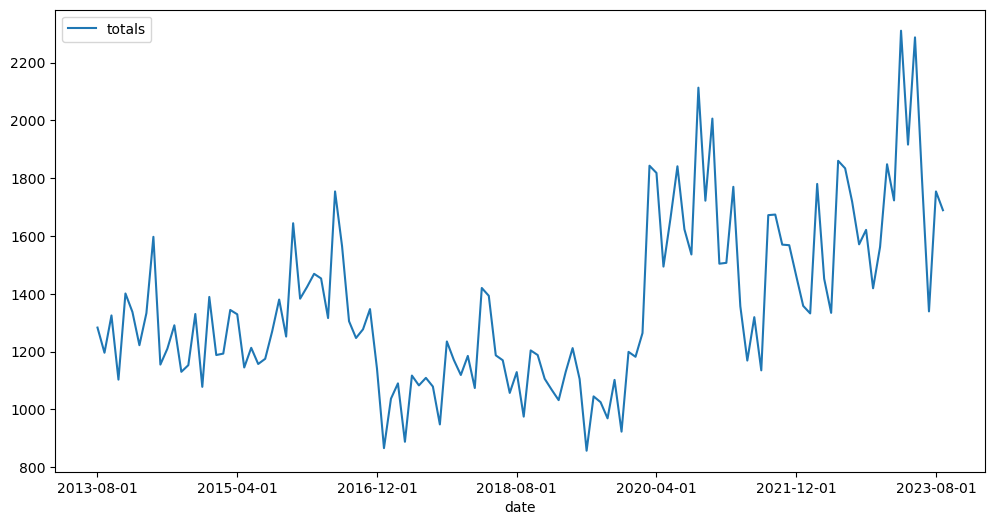

In [602]:
df_f = df_all[df_all['state'] == 'Hawaii']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [604]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [606]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [608]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0545 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0293
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0321
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0318
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0216
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0241
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0284
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0199
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0281
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0261  
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0303
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0253
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0256
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0220   
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0246
Epoch 16/1

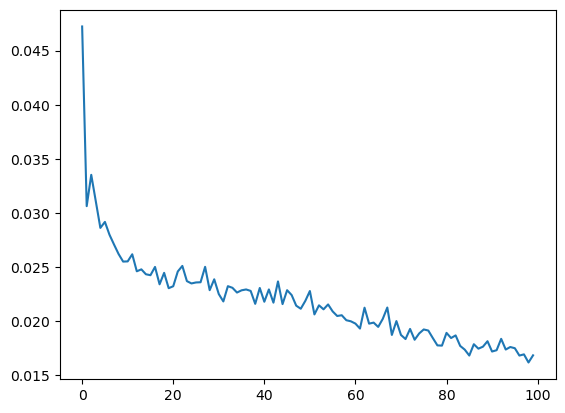

In [610]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [612]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


<Axes: xlabel='date'>

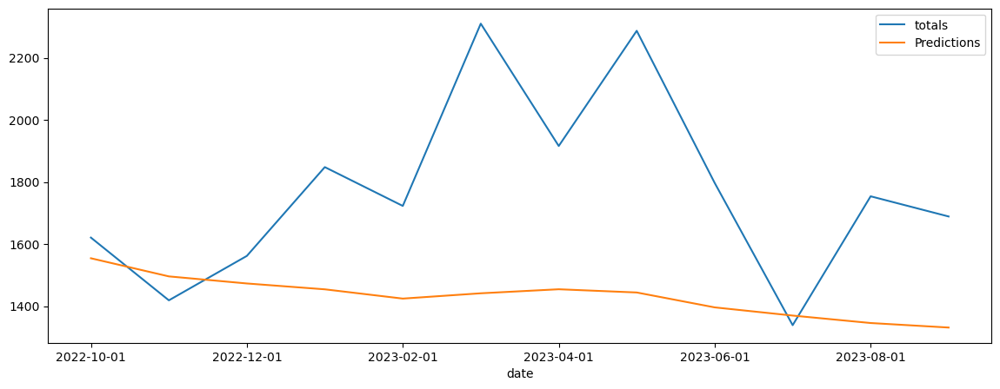

In [614]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [616]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Hawaii', 'RMSE': rmse})

446.77068970896545


## Idaho

<Axes: xlabel='date'>

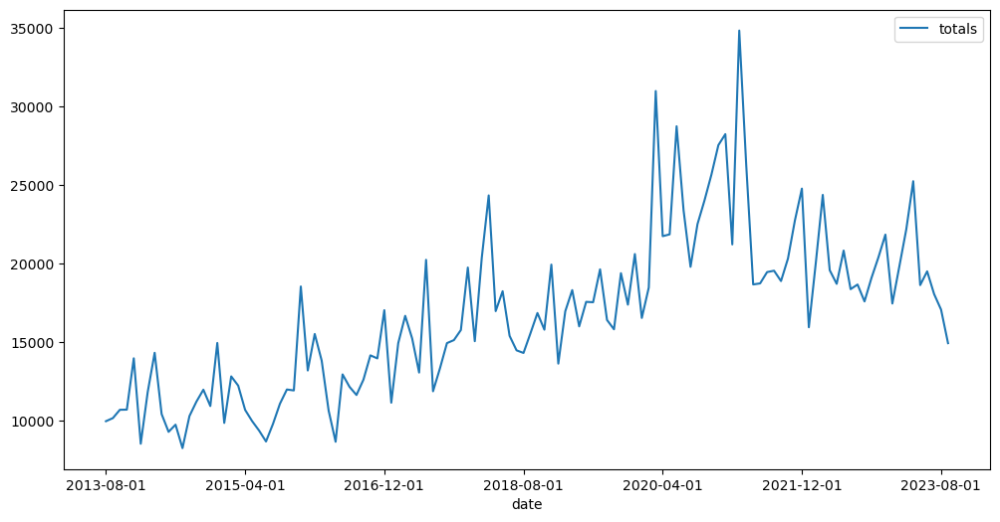

In [619]:
df_f = df_all[df_all['state'] == 'Idaho']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [621]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [623]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [625]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0767  
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0213
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0229   
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0151
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0209
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0171
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0230  
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0218
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0279   
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0172
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0154
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142   
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0153
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0149   
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0165


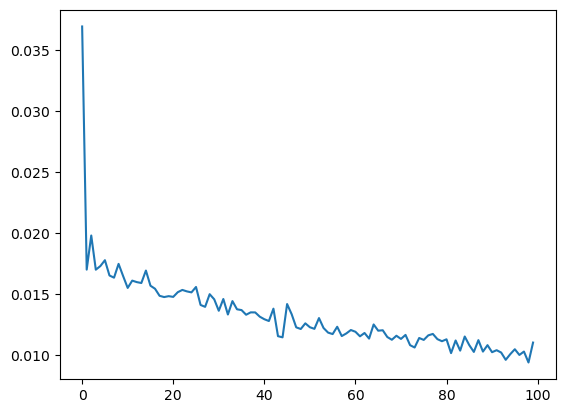

In [627]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [629]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


<Axes: xlabel='date'>

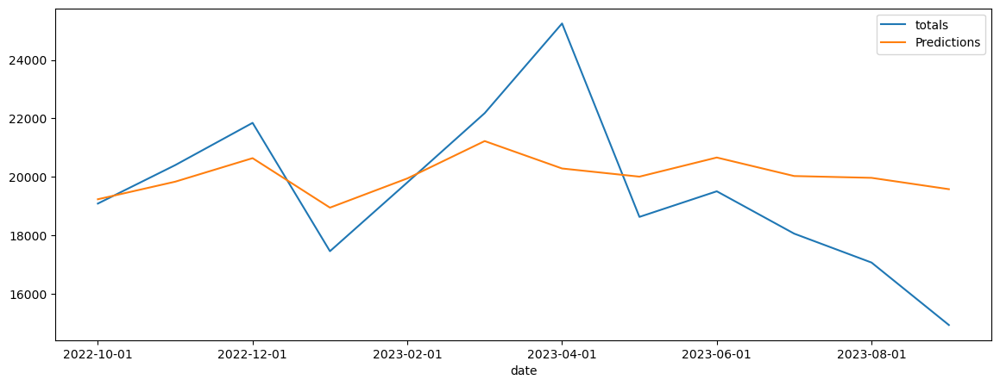

In [631]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [633]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Idaho', 'RMSE': rmse})

2356.165875381567


## Illinois

<Axes: xlabel='date'>

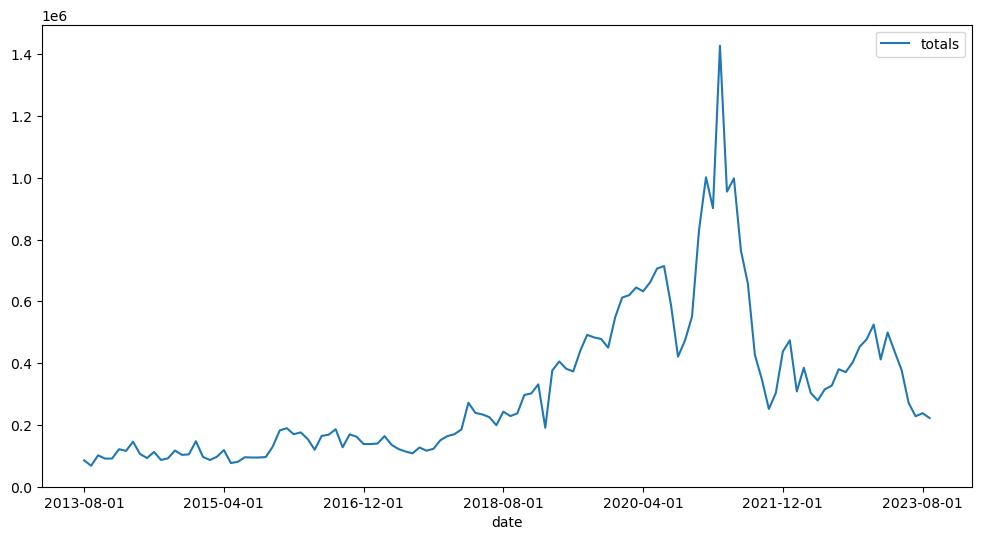

In [636]:
df_f = df_all[df_all['state'] == 'Illinois']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [638]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [640]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [642]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0457 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0123   
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0107   
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0142
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0101
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0156
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0192
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0067
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0049   
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0086   
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0052   
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0031   
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0059   
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0109   
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss

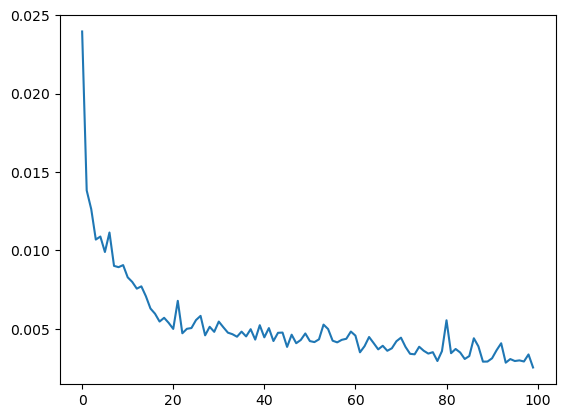

In [644]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [646]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


<Axes: xlabel='date'>

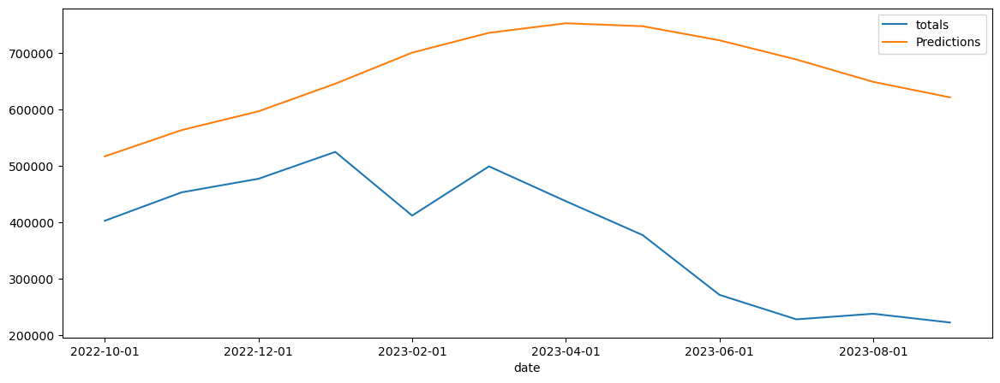

In [648]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [650]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Illinois', 'RMSE': rmse})

313033.67853088607


## Indiana

<Axes: xlabel='date'>

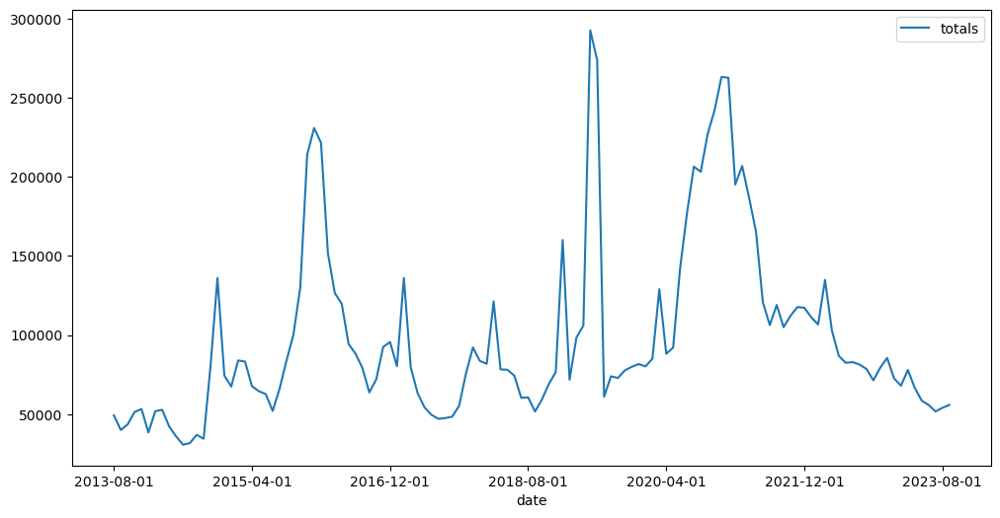

In [653]:
df_f = df_all[df_all['state'] == 'Indiana']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [655]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [657]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [659]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0869  
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0500
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0445
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0288
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0340
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0454
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0230
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0197
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0218
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0318
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0340
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0300
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0167   
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0163
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0223
Epoch 16/10

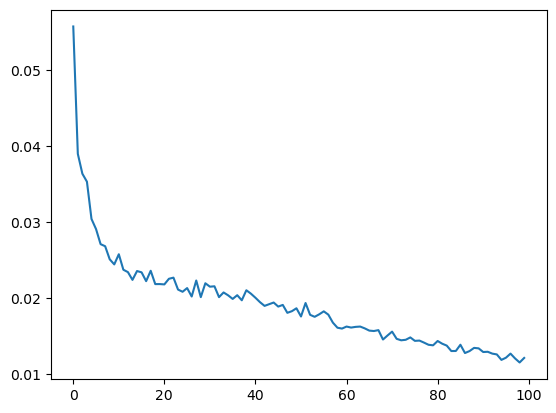

In [661]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [663]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


<Axes: xlabel='date'>

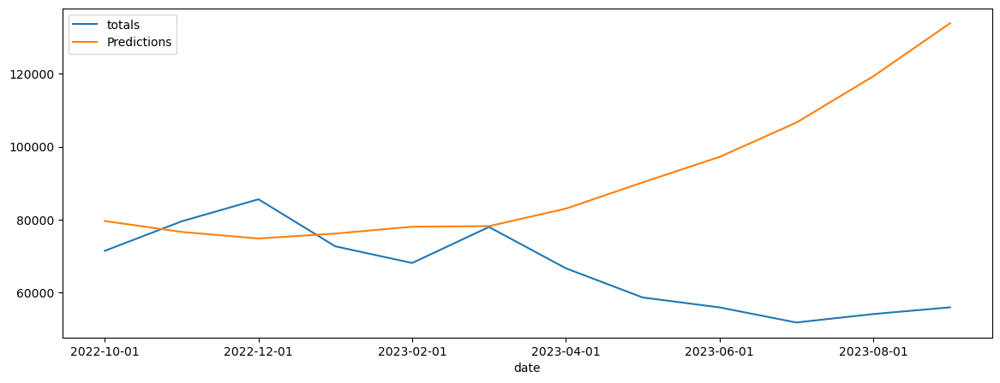

In [665]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [667]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Indiana', 'RMSE': rmse})

37185.37137942758


## Iowa

<Axes: xlabel='date'>

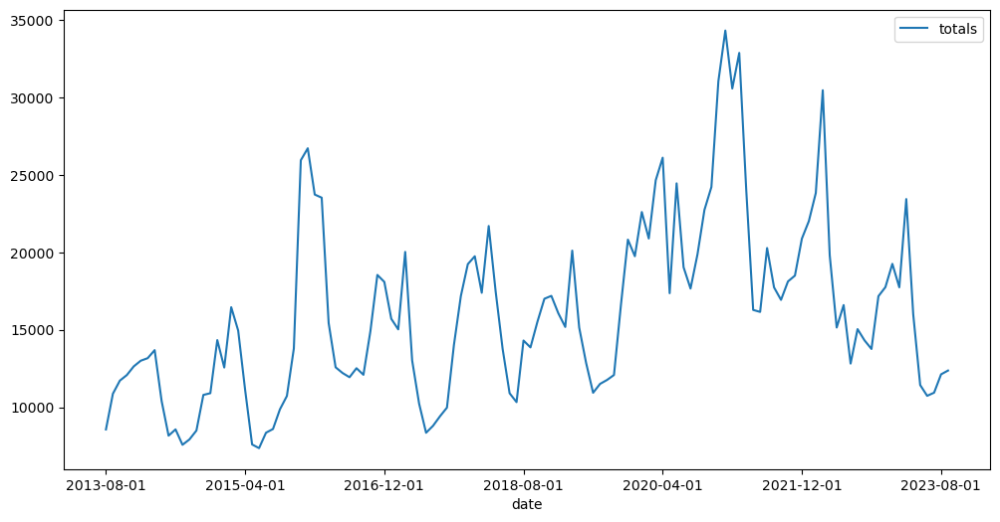

In [670]:
df_f = df_all[df_all['state'] == 'Iowa']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [672]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [674]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [676]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1000
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0472
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0281
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0351
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0249
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0258
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0320
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0202
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0144
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0279   
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0173   
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0170   
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0162
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0154
Epoch 1

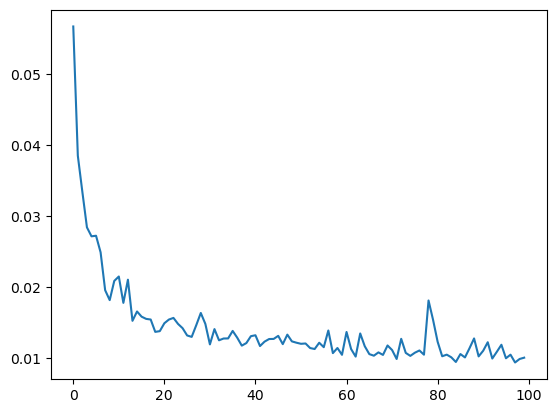

In [678]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [680]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


<Axes: xlabel='date'>

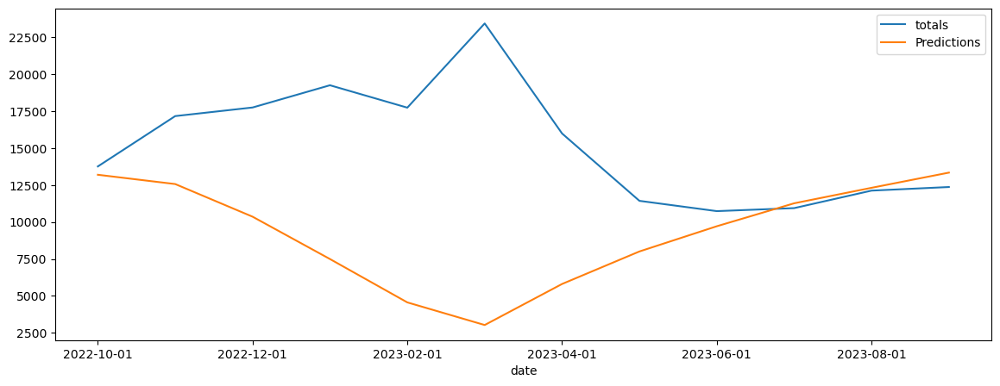

In [682]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [684]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Iowa', 'RMSE': rmse})

8766.745244097572


## Kansas

<Axes: xlabel='date'>

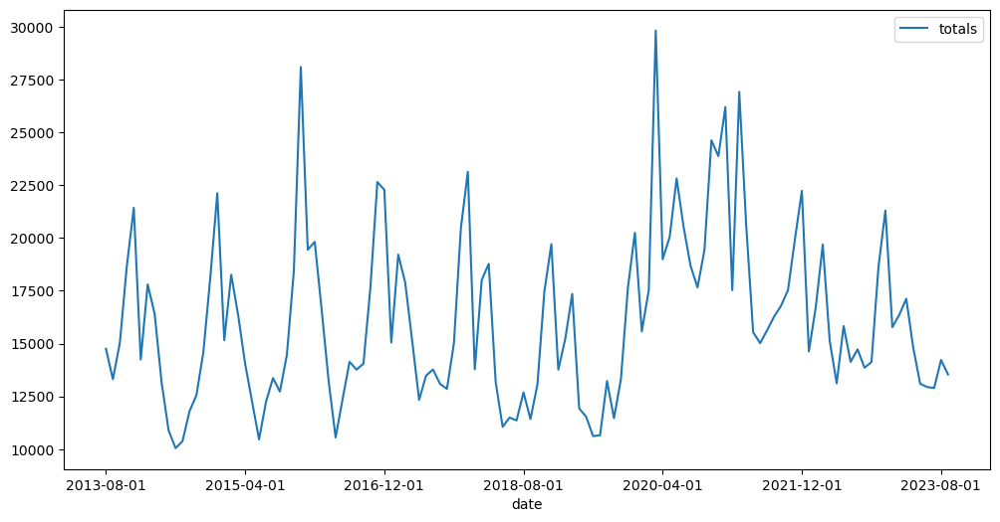

In [687]:
df_f = df_all[df_all['state'] == 'Kansas']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [689]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [691]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [693]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0866 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0526
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0503   
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0362
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0422
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0309
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0306
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0478
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0334
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0275
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0245
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0287
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0290
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0248  
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0256
Epoch 16/1

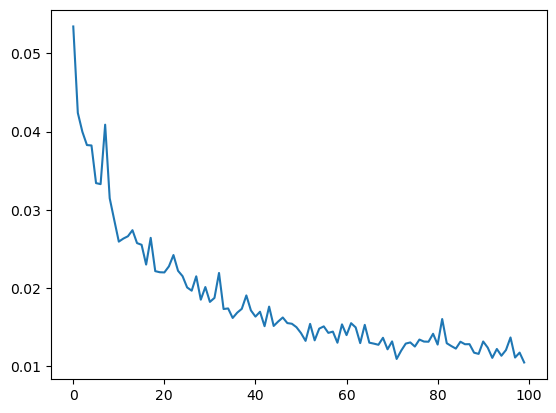

In [695]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [697]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


<Axes: xlabel='date'>

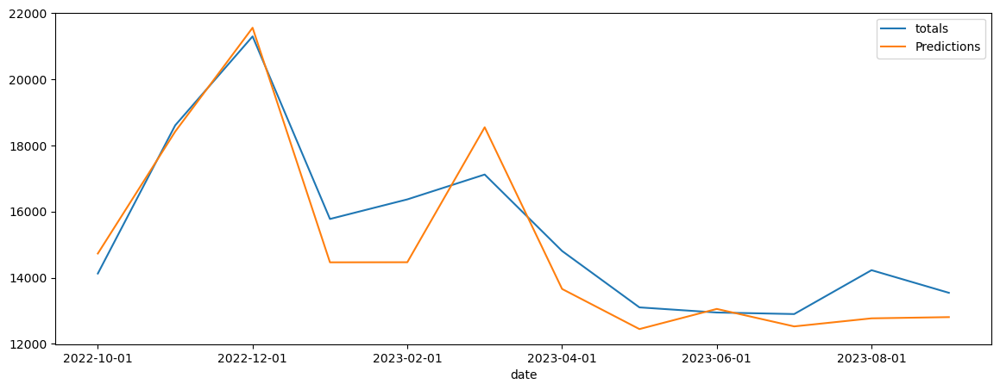

In [699]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [701]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Kansas', 'RMSE': rmse})

1017.328547991605


## Kentucky

<Axes: xlabel='date'>

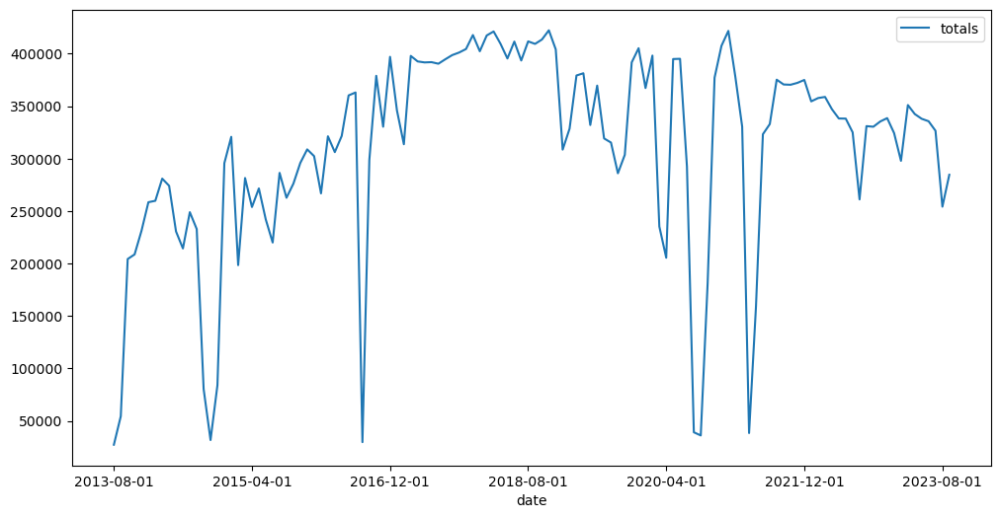

In [704]:
df_f = df_all[df_all['state'] == 'Kentucky']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [706]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [708]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [710]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.2951
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0548  
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0418
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0395
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0613
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0510
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0339
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0513
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0575
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0466
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0651
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0405
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0533  
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0470
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0376  
Epoch 16/1

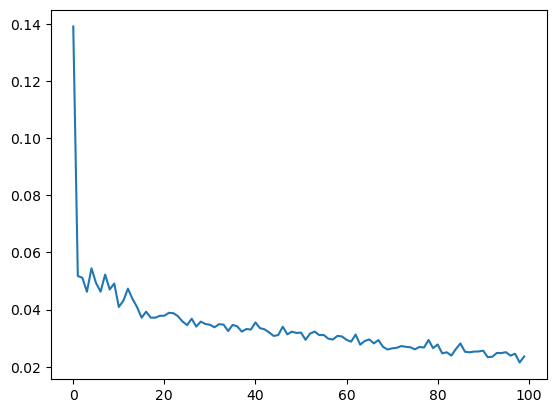

In [712]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [714]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


<Axes: xlabel='date'>

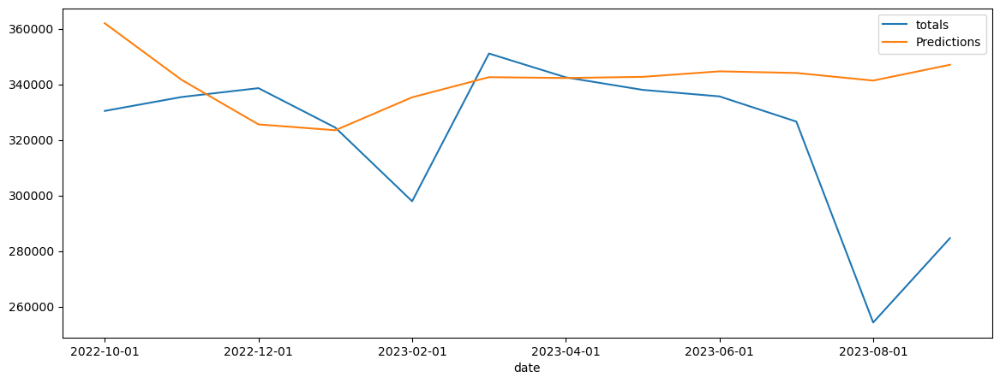

In [716]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [718]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Kentucky', 'RMSE': rmse})

34847.89035323813


## Louisiana

<Axes: xlabel='date'>

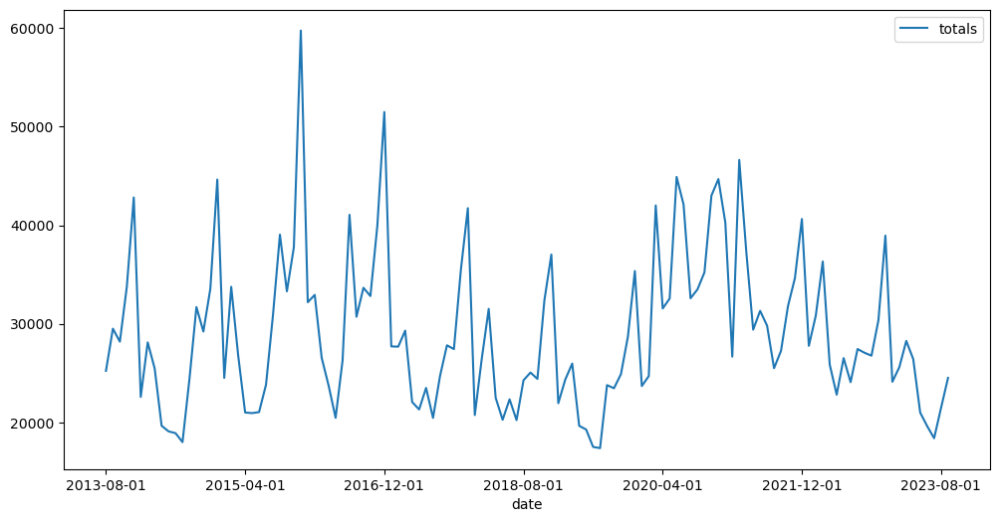

In [721]:
df_f = df_all[df_all['state'] == 'Louisiana']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [723]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [725]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [727]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0659 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0279
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0243
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0378
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0334   
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0289
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0253
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0262  
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0223
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0319
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0248
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0215
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0250
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0243
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0308  
Epoch 16

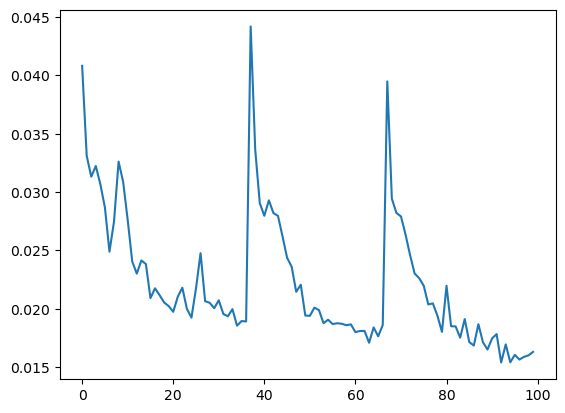

In [729]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [731]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


<Axes: xlabel='date'>

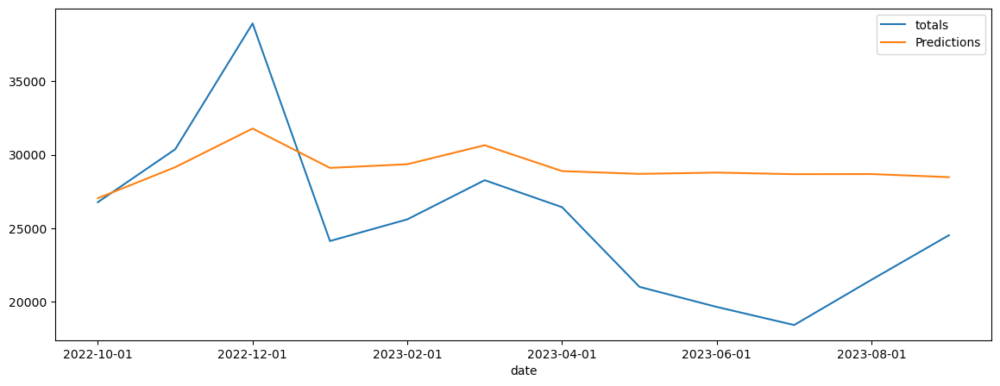

In [733]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [735]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Louisiana', 'RMSE': rmse})

5917.542935400927


## Maine

<Axes: xlabel='date'>

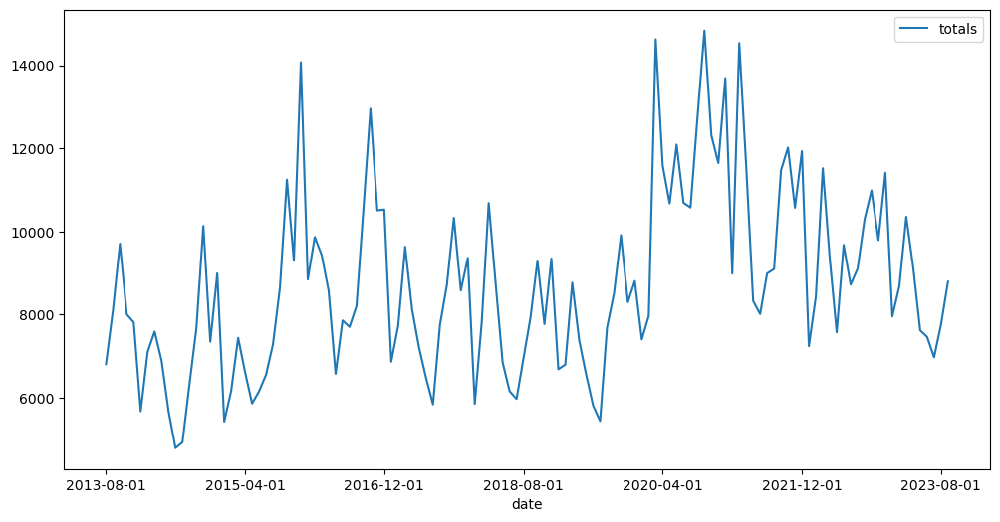

In [738]:
df_f = df_all[df_all['state'] == 'Maine']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [740]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [742]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [744]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1391 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0363
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0429
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0392  
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0339   
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0475
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0355
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0385
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0349
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0404
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0285  
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0376
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0353
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0430
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0325
Epoch 16

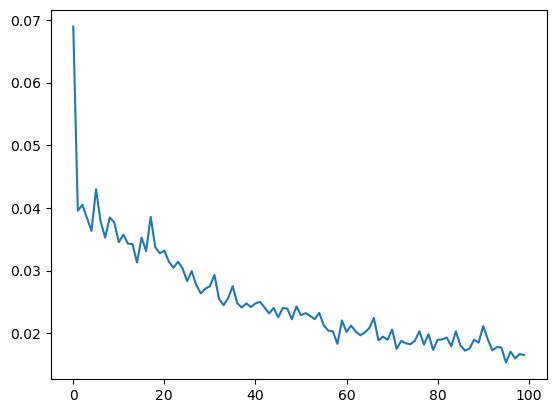

In [746]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [748]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


<Axes: xlabel='date'>

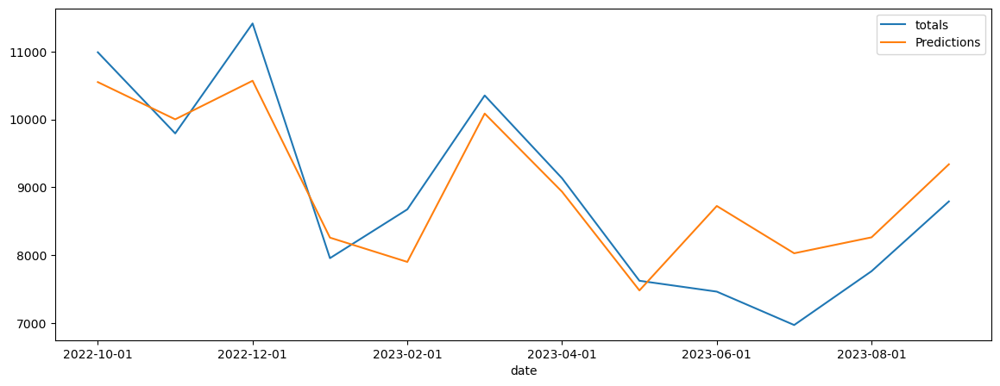

In [750]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [752]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Maine', 'RMSE': rmse})

647.3339335068484


## Maryland

<Axes: xlabel='date'>

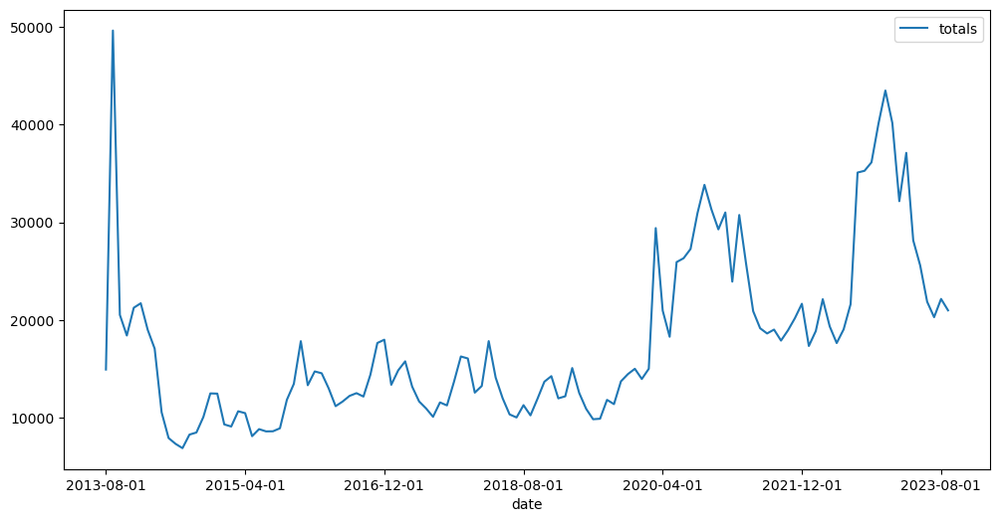

In [755]:
df_f = df_all[df_all['state'] == 'Maryland']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [756]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [759]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [761]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0349  
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0122
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0109   
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0091
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0063
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0131
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0105
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0063
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0073   
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0102
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0056
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0119
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0056
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0071  
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0059  
Epoc

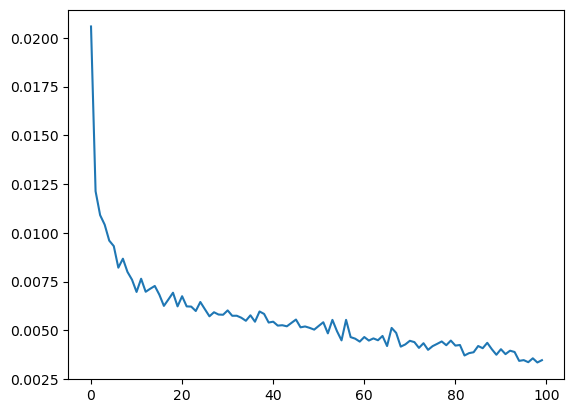

In [763]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [765]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


<Axes: xlabel='date'>

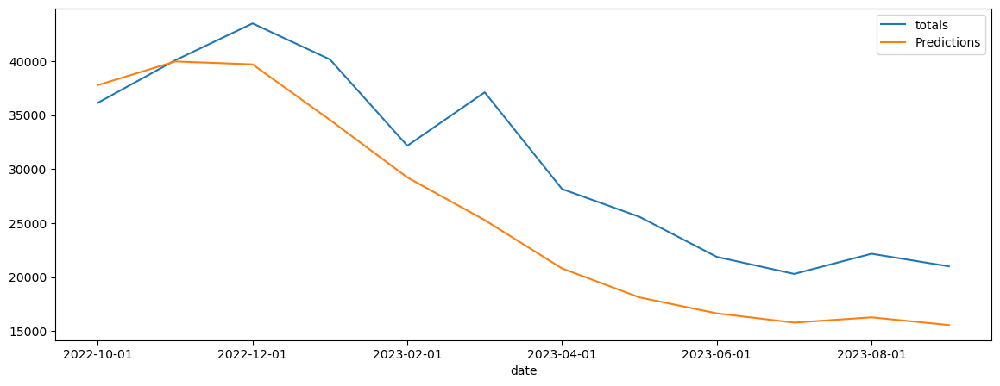

In [767]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [769]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Maryland', 'RMSE': rmse})

5910.768233719047


## Massachusetts

<Axes: xlabel='date'>

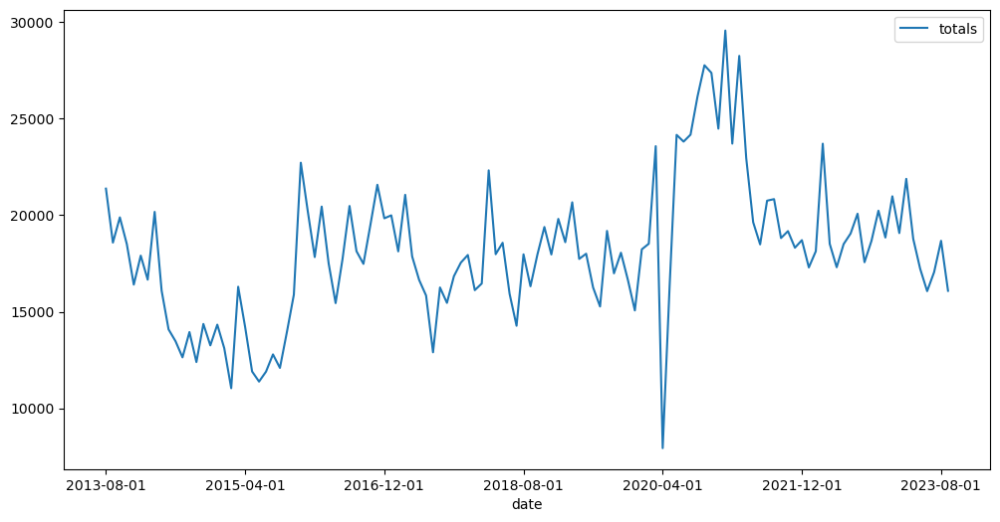

In [772]:
df_f = df_all[df_all['state'] == 'Massachusetts']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [774]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [776]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [778]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1329  
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0220   
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0314
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0207
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0193
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0325
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0198
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0170   
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0185   
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0195
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0112
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0164
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0167   
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0131
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0168
Ep

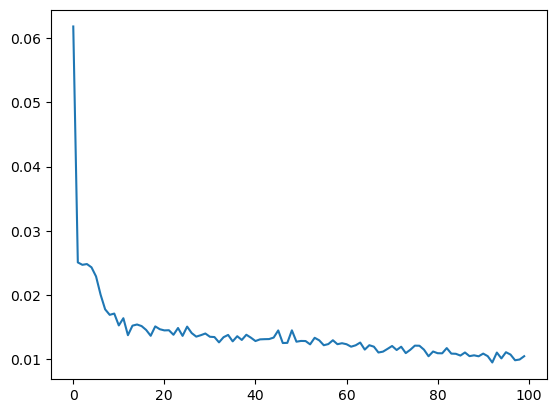

In [780]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [782]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


<Axes: xlabel='date'>

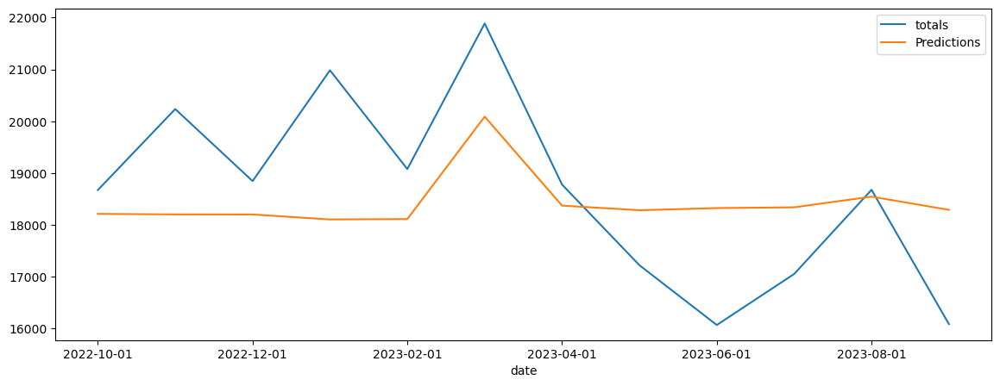

In [784]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [786]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Massachusetts', 'RMSE': rmse})

1584.6046340708874


## Michigan

<Axes: xlabel='date'>

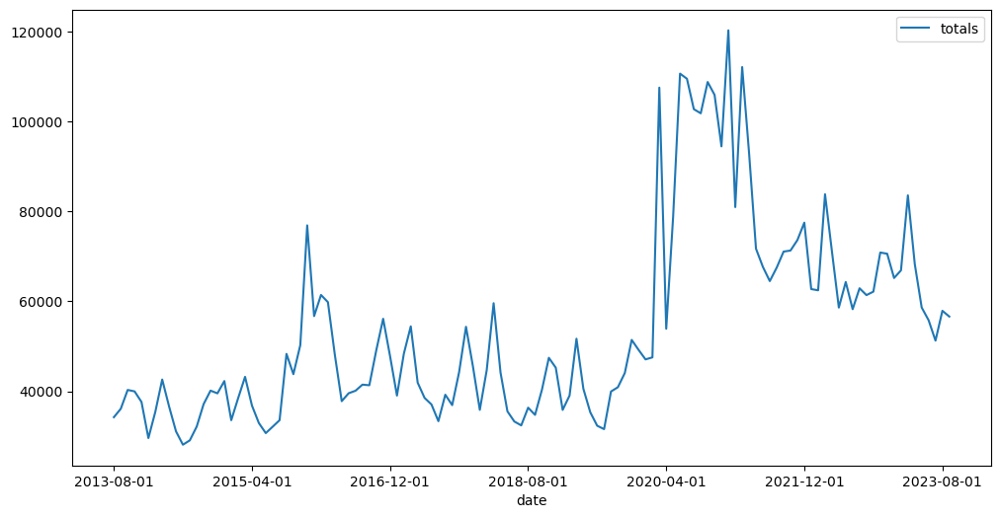

In [790]:
df_f = df_all[df_all['state'] == 'Michigan']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [792]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [794]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [796]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0558  
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0302
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0203
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0216
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0191
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0207   
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0231
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0227
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0231
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0181
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0154
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0211
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0195
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0227  
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0124
Epoch 16/

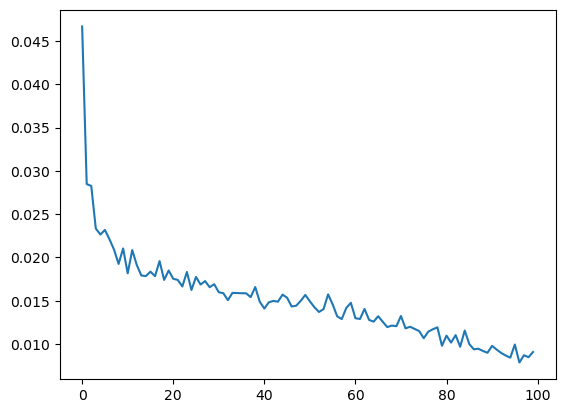

In [798]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [799]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


<Axes: xlabel='date'>

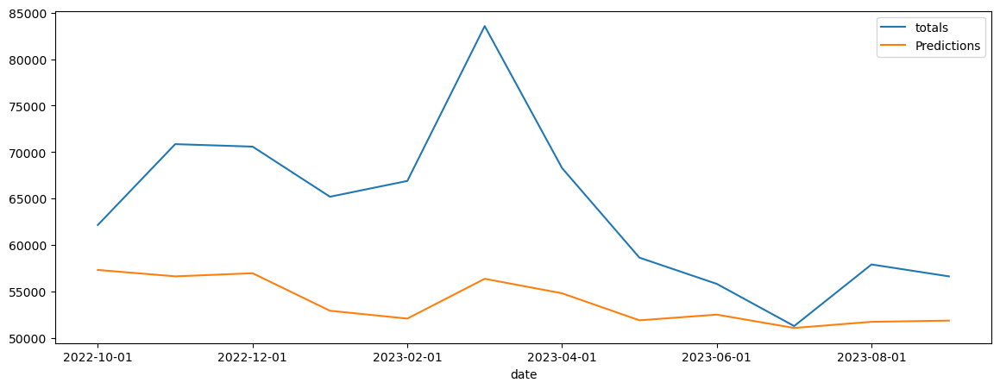

In [802]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [804]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Michigan', 'RMSE': rmse})

12314.854809007706


## Minnesota

<Axes: xlabel='date'>

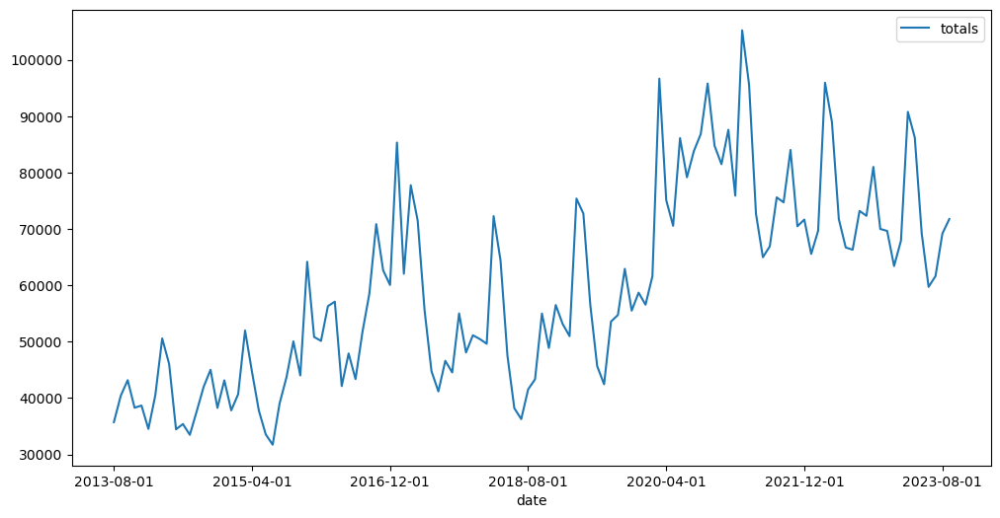

In [807]:
df_f = df_all[df_all['state'] == 'Minnesota']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [809]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [811]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [813]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1039 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0236
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0335
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0292
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0319
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0234
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0251
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0241
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0170
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0227
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0210   
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0193
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0159
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0194
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0261
Epoch 16/100

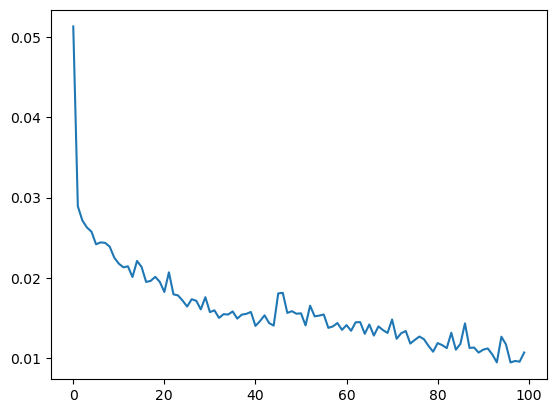

In [814]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [817]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


<Axes: xlabel='date'>

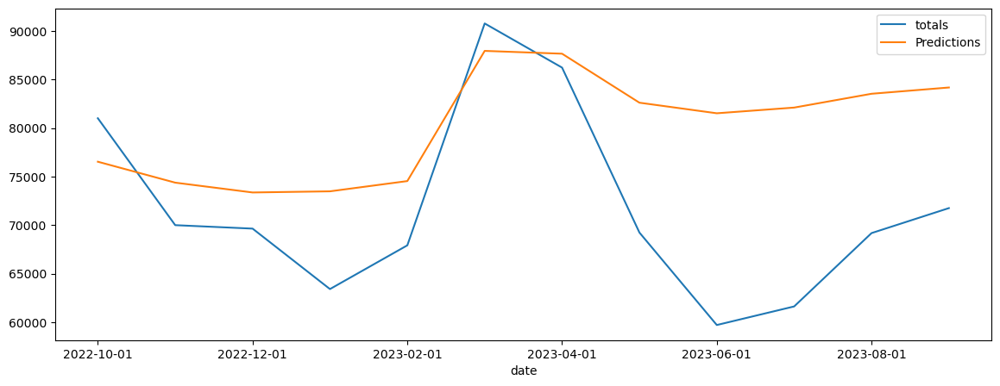

In [819]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [821]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Minnesota', 'RMSE': rmse})

11690.230282129482


## Mississippi

<Axes: xlabel='date'>

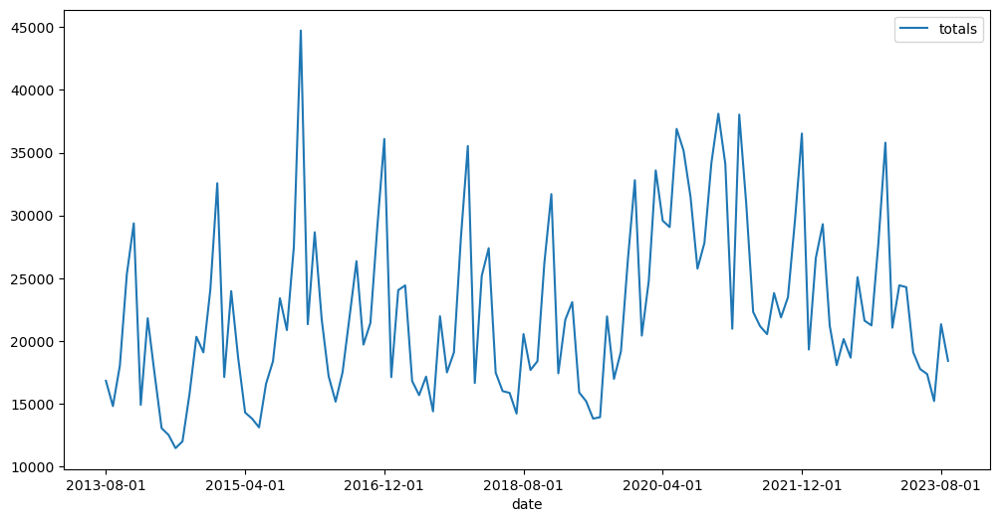

In [824]:
df_f = df_all[df_all['state'] == 'Mississippi']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [826]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [828]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [830]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0984 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0344
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0372
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0342
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0339
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0356
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0317
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0293
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0310   
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0297
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0272
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0223
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0257
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0325
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0446   
Epoch 16/

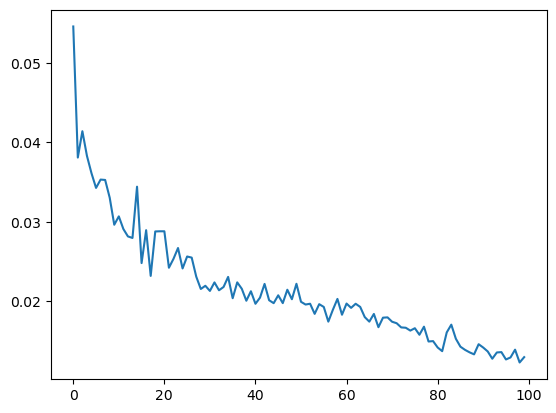

In [832]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [834]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


<Axes: xlabel='date'>

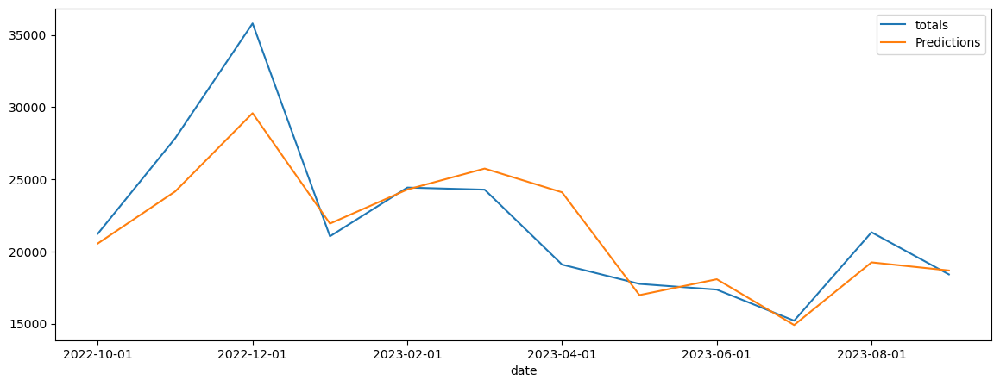

In [836]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [838]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Mississippi', 'RMSE': rmse})

2681.222425143632


## Missouri

<Axes: xlabel='date'>

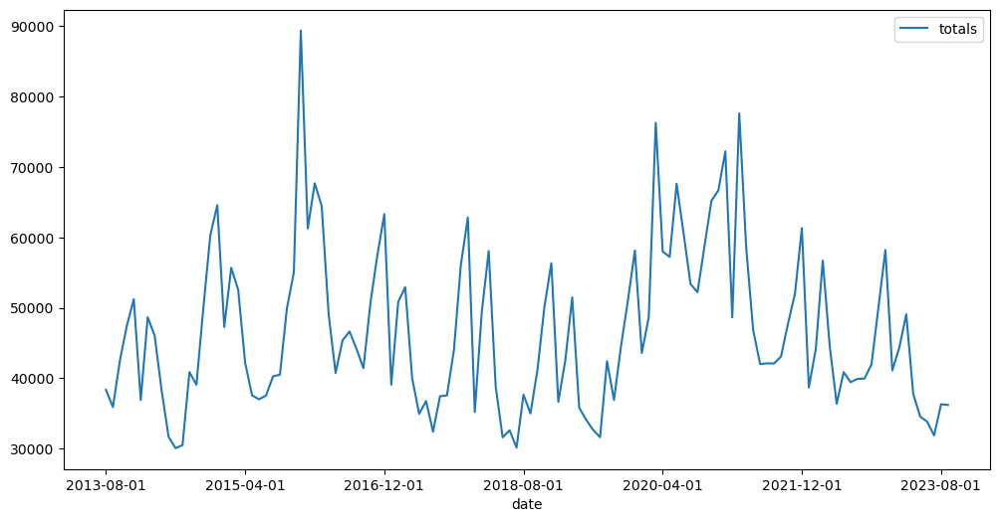

In [841]:
df_f = df_all[df_all['state'] == 'Missouri']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [843]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [845]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [847]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0851  
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0319   
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0337
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0382
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0383
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0321
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0361   
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0273
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0328
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0371
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0217
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0266  
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0237  
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0179
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0288
Epoc

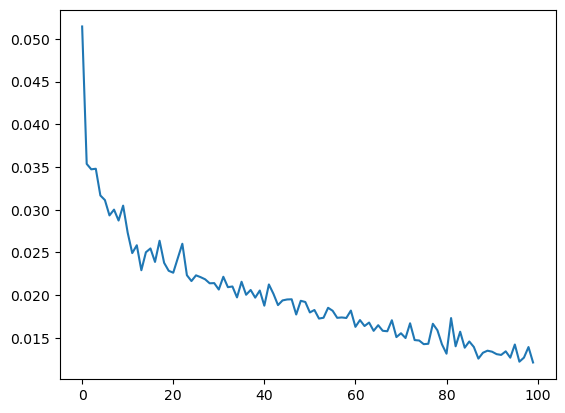

In [848]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [851]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step


<Axes: xlabel='date'>

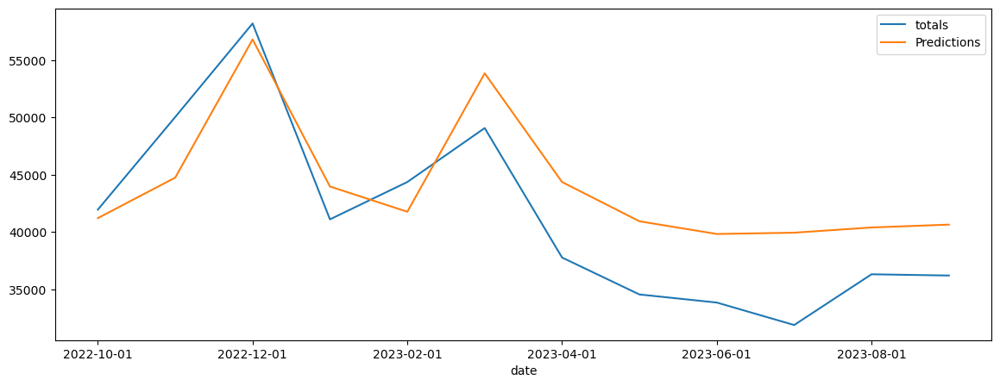

In [853]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [855]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Missouri', 'RMSE': rmse})

4914.2316383543675


## Montana

<Axes: xlabel='date'>

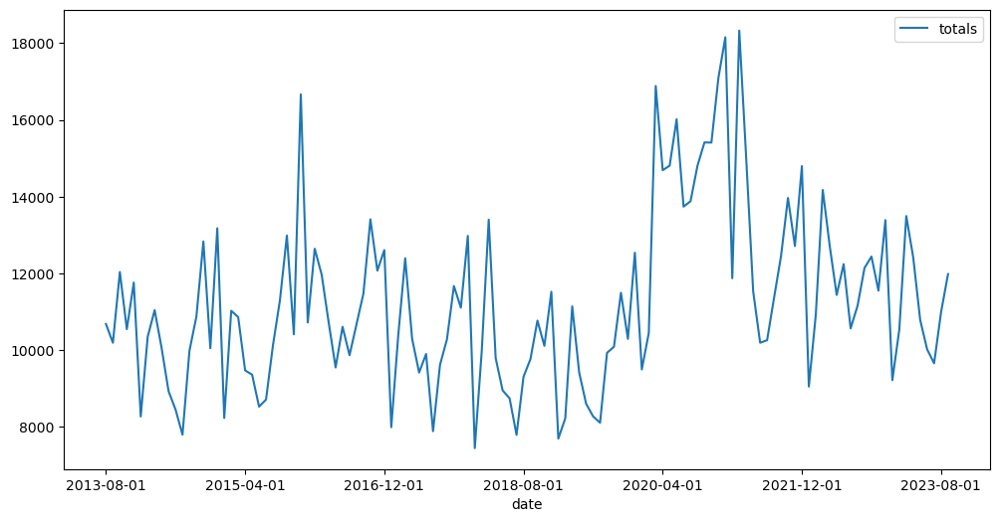

In [858]:
df_f = df_all[df_all['state'] == 'Montana']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [860]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [862]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [864]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0625 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0450
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0491
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0378
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0423
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0322
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0340
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0307
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0323
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0336
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0376
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0281
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0401
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0407
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0245
Epoch 16/100
98

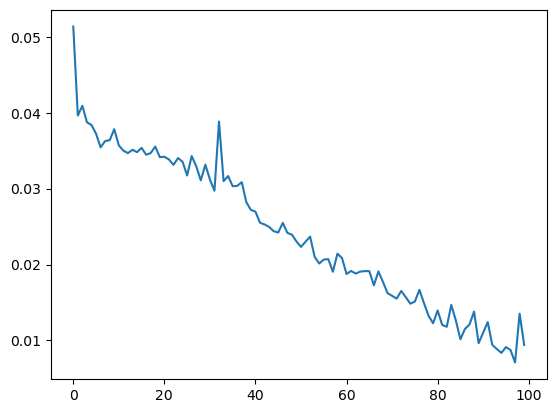

In [866]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [868]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


<Axes: xlabel='date'>

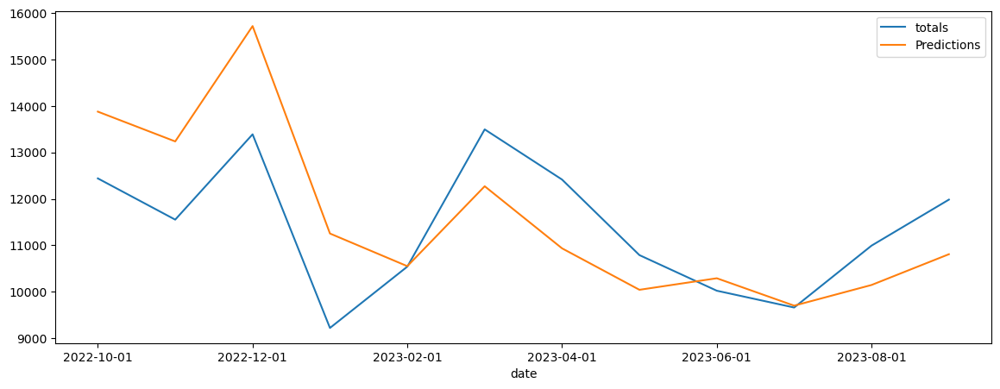

In [870]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [872]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Montana', 'RMSE': rmse})

1319.928811006929


## Nebraska

<Axes: xlabel='date'>

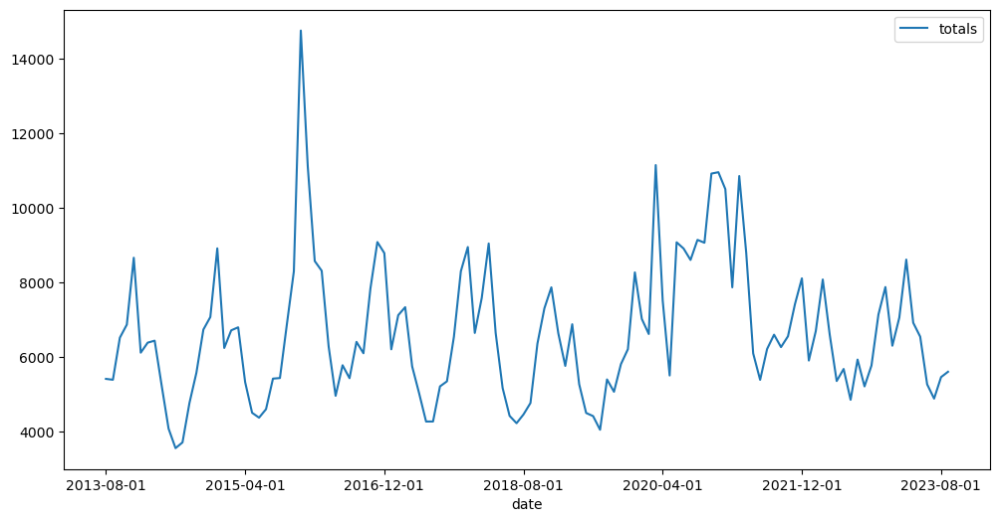

In [875]:
df_f = df_all[df_all['state'] == 'Nebraska']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [877]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [879]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [881]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0761
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0283
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0218
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0227
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0196
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0349  
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0188   
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0172
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0204
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0195  
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0181
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0127  
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0162
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0215
Epoch 1

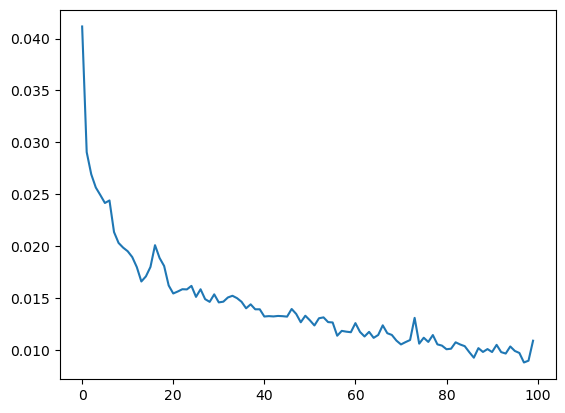

In [883]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [885]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


<Axes: xlabel='date'>

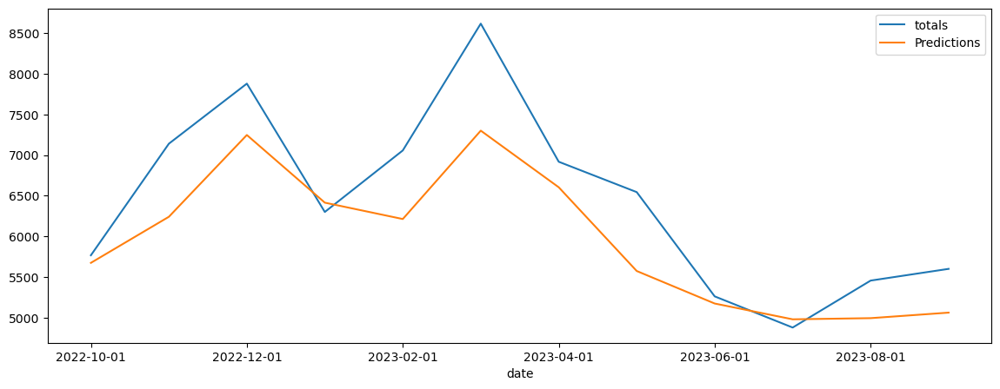

In [887]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [889]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Nebraska', 'RMSE': rmse})

659.7654870906039


## Nevada

<Axes: xlabel='date'>

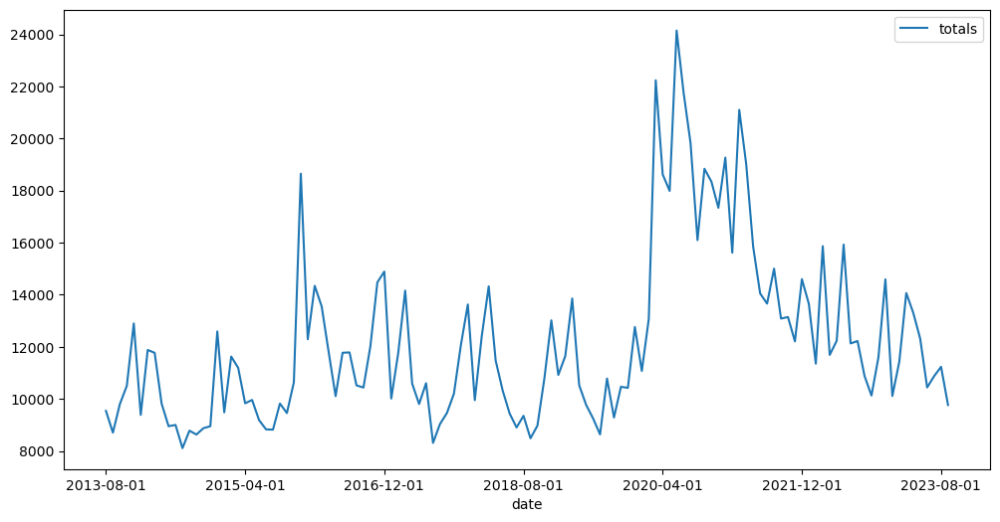

In [892]:
df_f = df_all[df_all['state'] == 'Nevada']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [894]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [896]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [898]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0464
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0363
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0268  
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0195
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0330  
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0257
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0435
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0176
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0234
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0340
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0311
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0239
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0168
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0169
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0186
Epoch 16/100

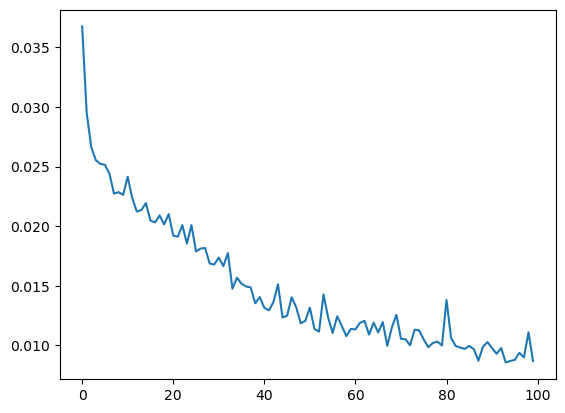

In [900]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [902]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


<Axes: xlabel='date'>

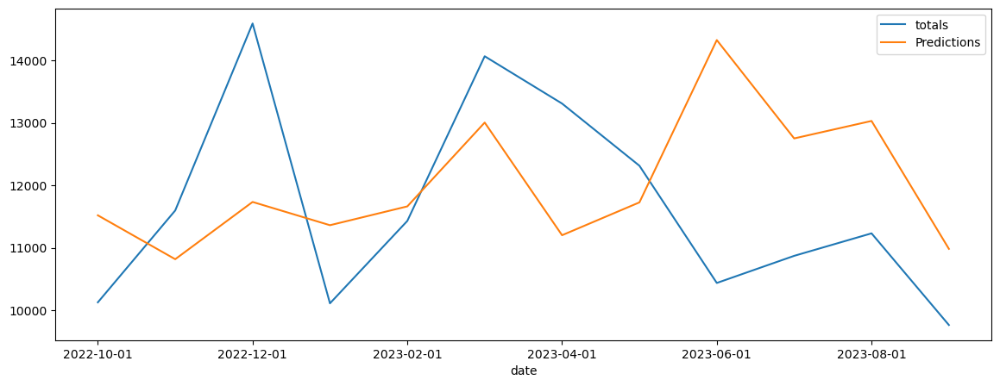

In [904]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [906]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Nevada', 'RMSE': rmse})

1861.745225710199


## New Hampshire

<Axes: xlabel='date'>

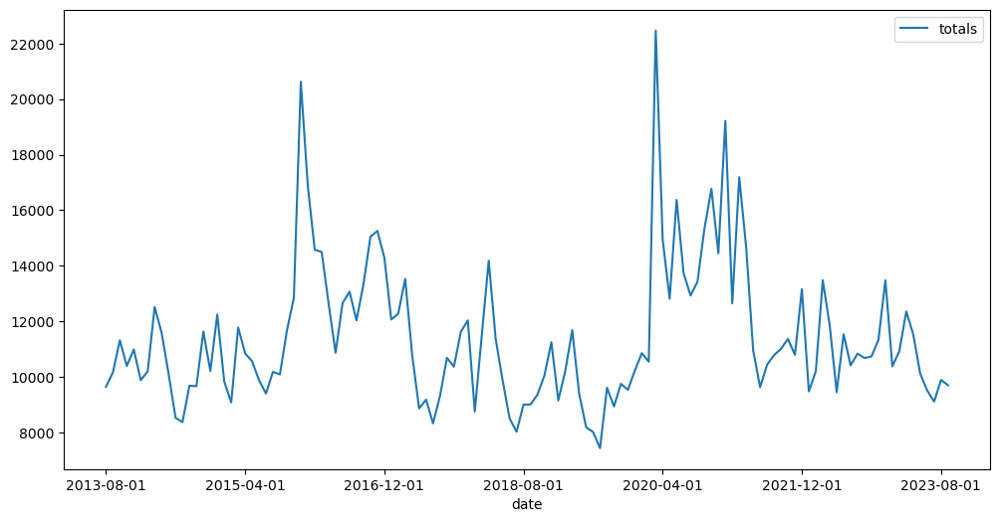

In [909]:
df_f = df_all[df_all['state'] == 'New Hampshire']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [910]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [913]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [915]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0407 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0302
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0211  
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0281
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0545
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0167
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0272
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0230  
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0463
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0177
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0278
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0192
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0177
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0198
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0126  
Epoch 16/

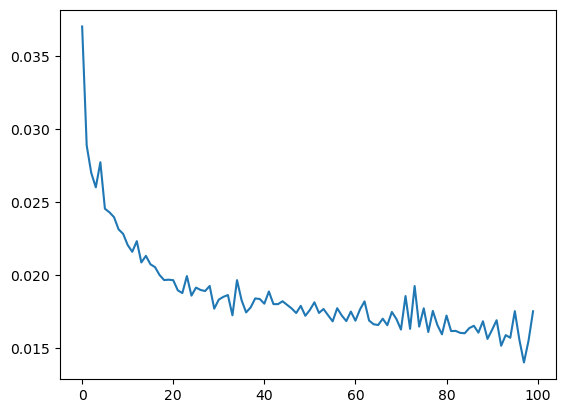

In [916]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [917]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


<Axes: xlabel='date'>

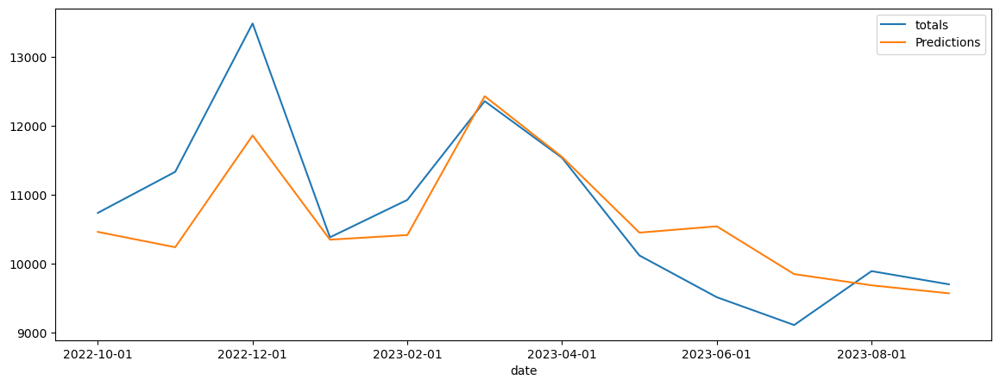

In [921]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [923]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'New Hampshire', 'RMSE': rmse})

703.4842627131542


## New Jersey

<Axes: xlabel='date'>

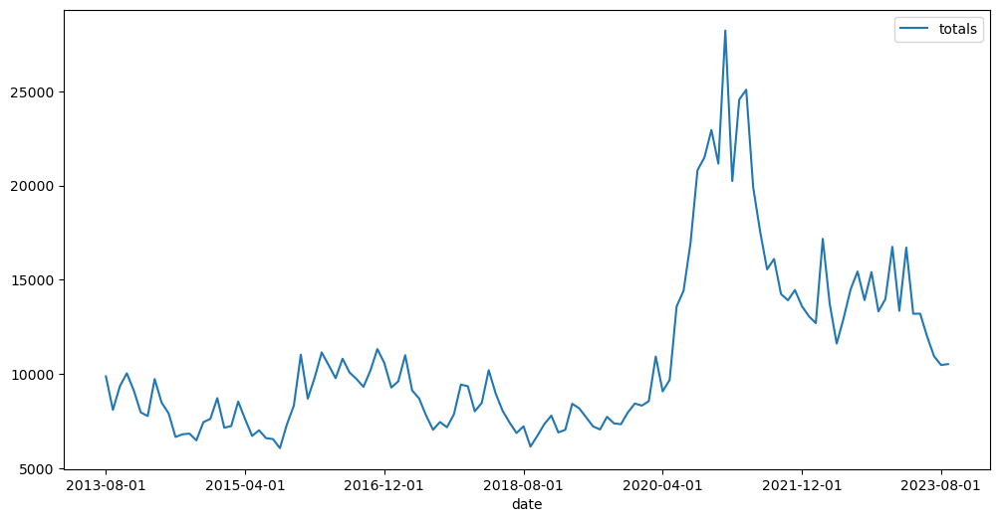

In [926]:
df_f = df_all[df_all['state'] == 'New Jersey']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [928]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [930]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [932]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0193
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0183
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0139
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0278
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0134  
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0095
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0105
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0127  
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0061
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0061
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0095
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0070  
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0059  
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0057  
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0086  
Epoc

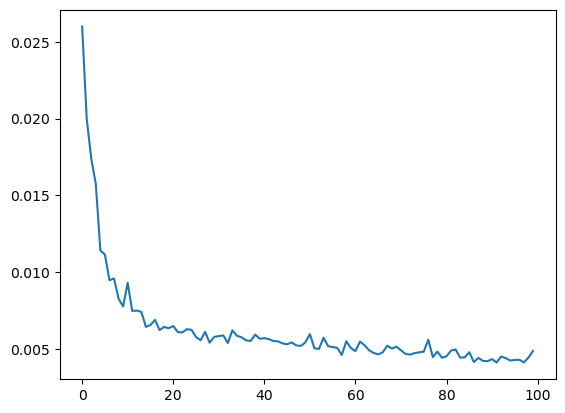

In [934]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [936]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


<Axes: xlabel='date'>

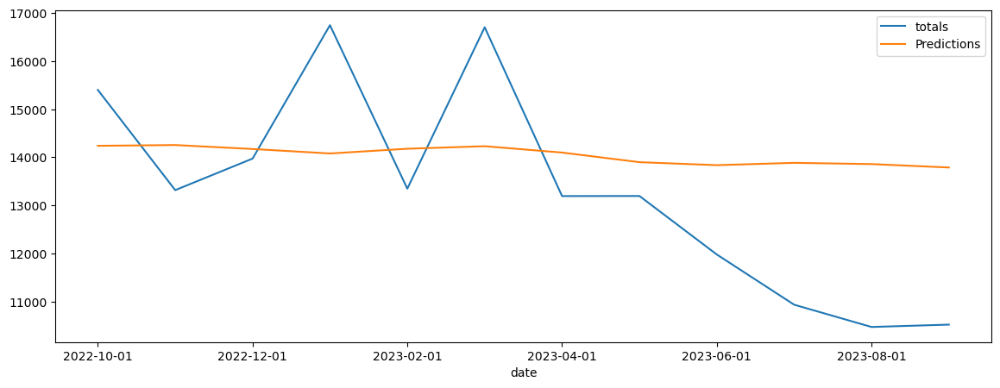

In [938]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [940]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'New Jersey', 'RMSE': rmse})

2078.6394711459375


## New Mexico

<Axes: xlabel='date'>

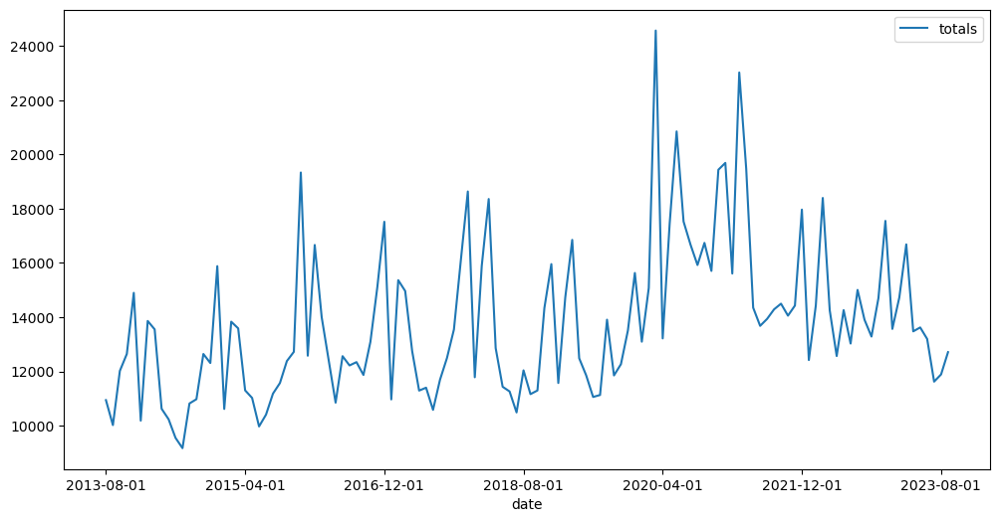

In [943]:
df_f = df_all[df_all['state'] == 'New Mexico']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [945]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [947]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [949]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0531 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0319  
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0271
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0265  
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0254
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0201  
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0337  
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0227
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0258
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0241
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0294
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0177
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0257
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0293
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0233
Epoch 1

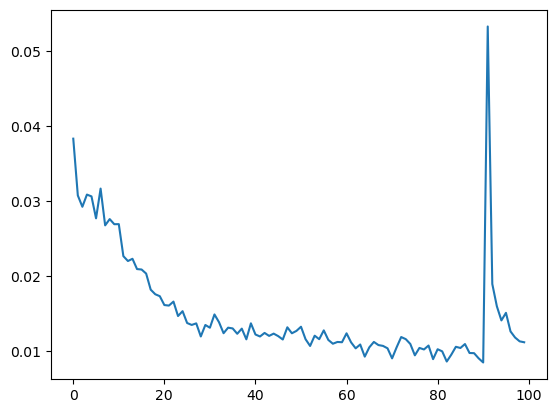

In [951]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [953]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


<Axes: xlabel='date'>

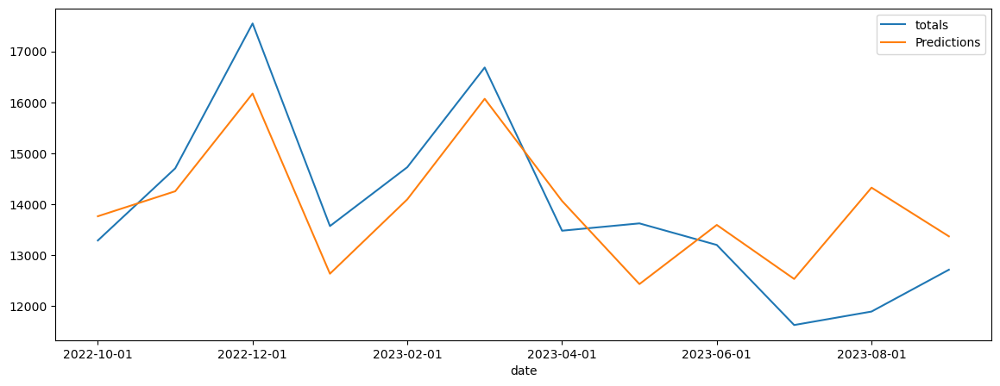

In [955]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [957]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'New Mexico', 'RMSE': rmse})

1044.283134122149


## New York

<Axes: xlabel='date'>

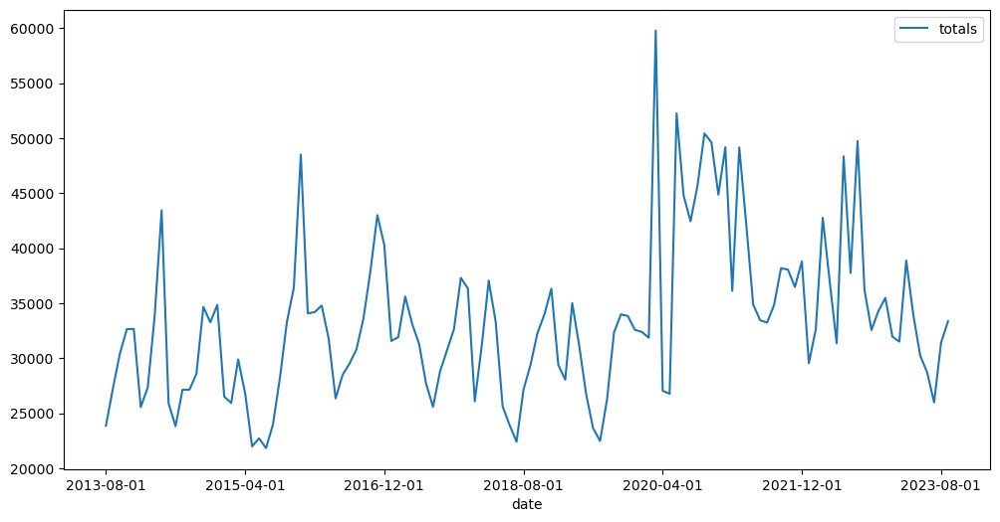

In [960]:
df_f = df_all[df_all['state'] == 'New York']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [962]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [964]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [966]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0441 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0271
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0344
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0241
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0278
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0432
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0259  
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0253
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0274
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0229
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0395
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0276  
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0243  
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0279
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0206
Epoch 16/

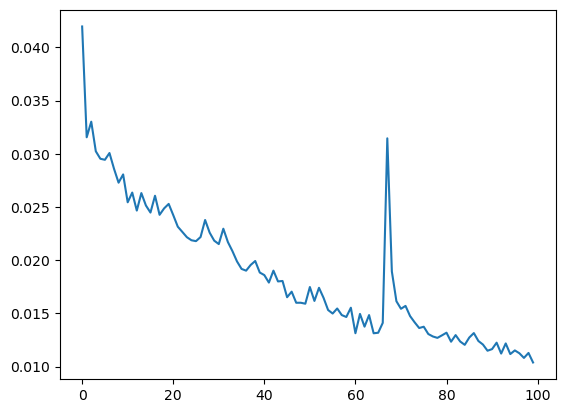

In [968]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [970]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


<Axes: xlabel='date'>

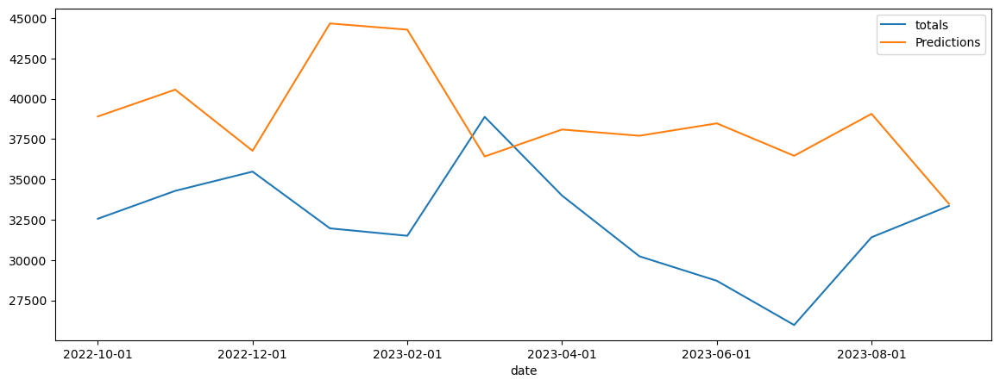

In [972]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [974]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'New York', 'RMSE': rmse})

7894.506420252644


## North Carolina

<Axes: xlabel='date'>

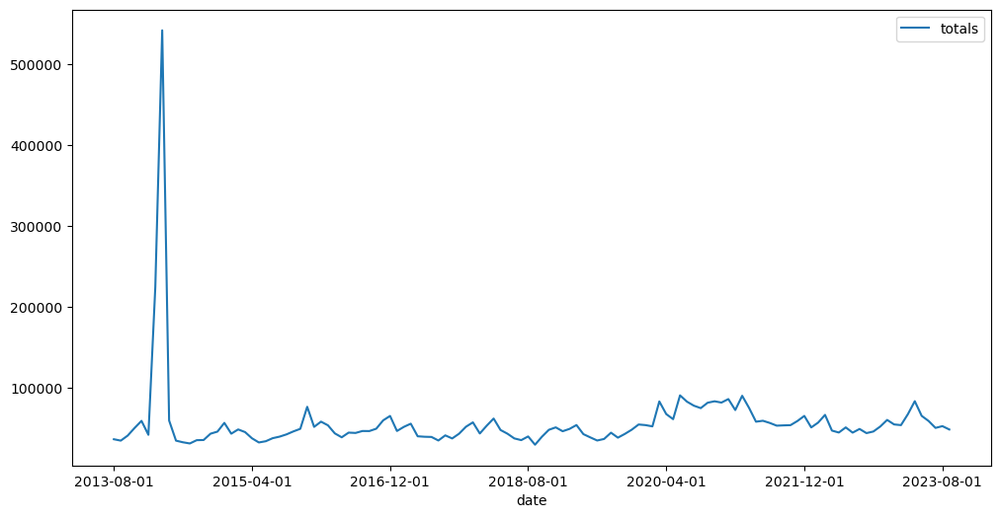

In [979]:
df_f = df_all[df_all['state'] == 'North Carolina']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [981]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [983]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [985]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0012 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.3468e-04
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 6.4498e-04
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.8639e-04
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.6350e-04
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.1107e-04
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.0093e-04
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 5.1427e-04
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.4919e-04
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.0751e-04
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 3.1461e-04
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.5115e-04
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 2.9160e-04
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 4.0027e-04
Epoch 15/100
98/98 ━━━━━━━━━━━

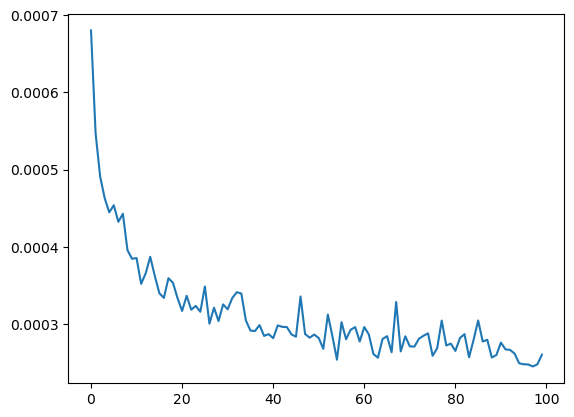

In [987]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [989]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


<Axes: xlabel='date'>

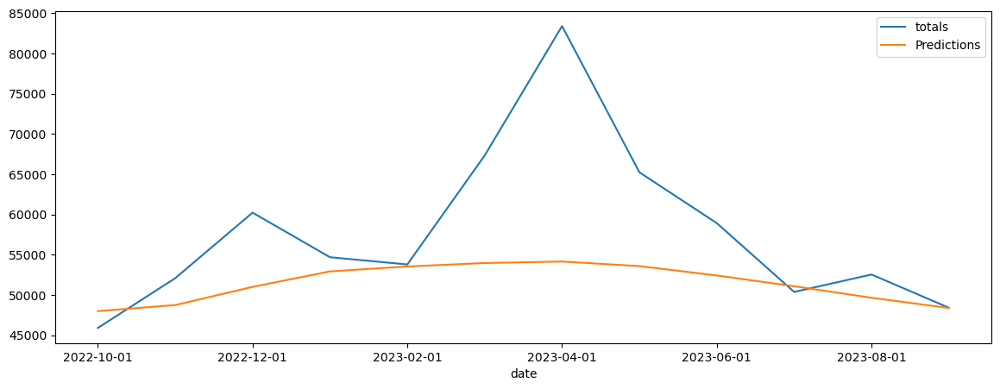

In [991]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [993]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'North Carolina', 'RMSE': rmse})

10505.708149529313


## North Dakota

<Axes: xlabel='date'>

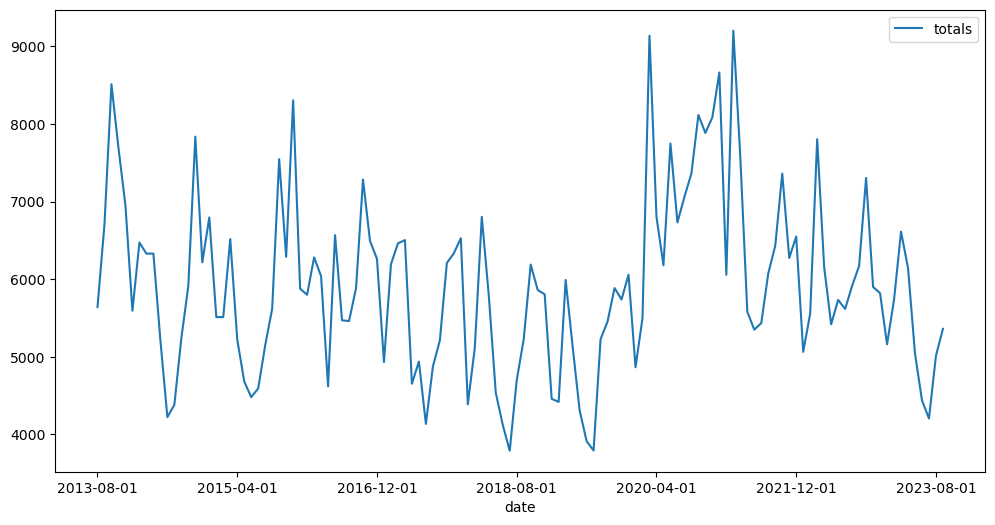

In [996]:
df_f = df_all[df_all['state'] == 'North Dakota']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [998]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [1000]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [1002]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0848 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0384  
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0389
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0382  
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0437
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0361
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0336  
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0359
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0253  
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0333
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0320  
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0327
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0344
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0386
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0347
Epoch

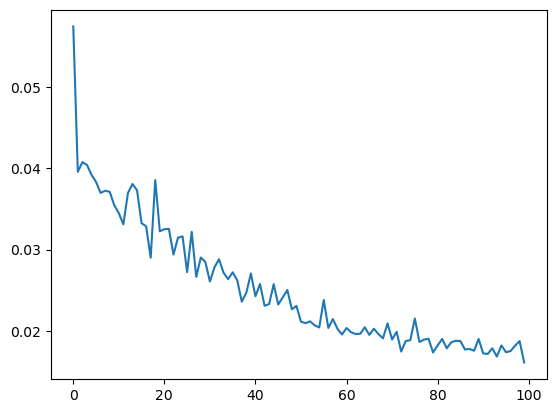

In [1004]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [1006]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


<Axes: xlabel='date'>

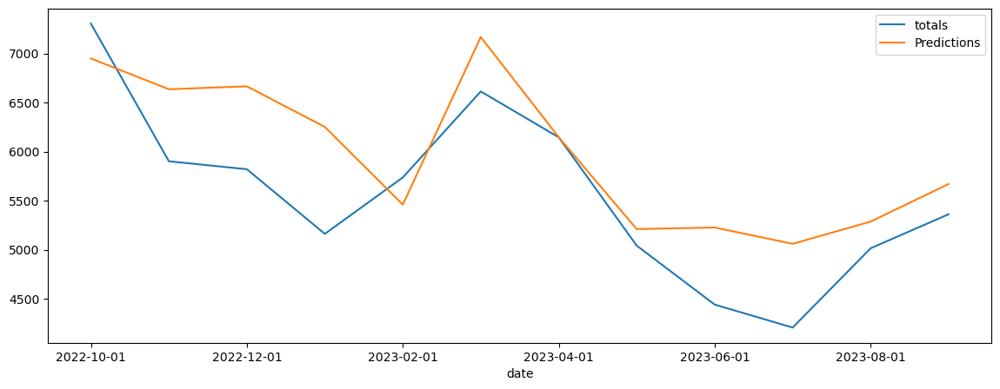

In [1008]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [1010]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'North Dakota', 'RMSE': rmse})

612.0200332418049


## Ohio

<Axes: xlabel='date'>

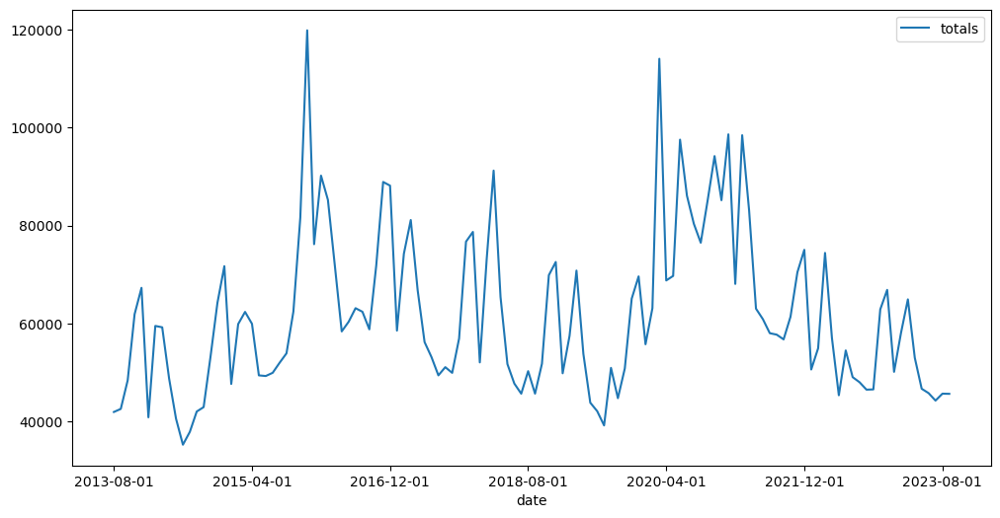

In [1013]:
df_f = df_all[df_all['state'] == 'Ohio']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [1015]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [1017]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [1019]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0635 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0276
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0242
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0306  
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0458
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0344
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0285
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0190  
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0294
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0300
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0240
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0266  
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0283  
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0293
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0213
Epoch 1

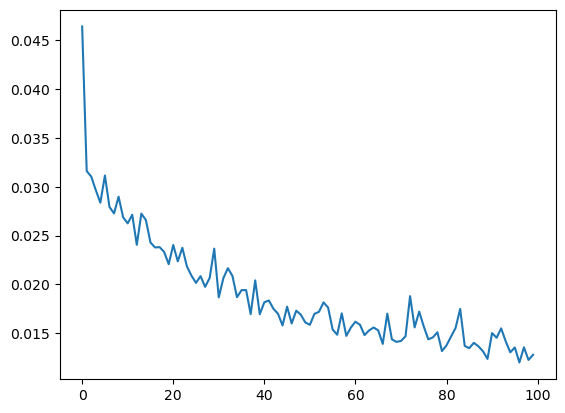

In [1021]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [1023]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


<Axes: xlabel='date'>

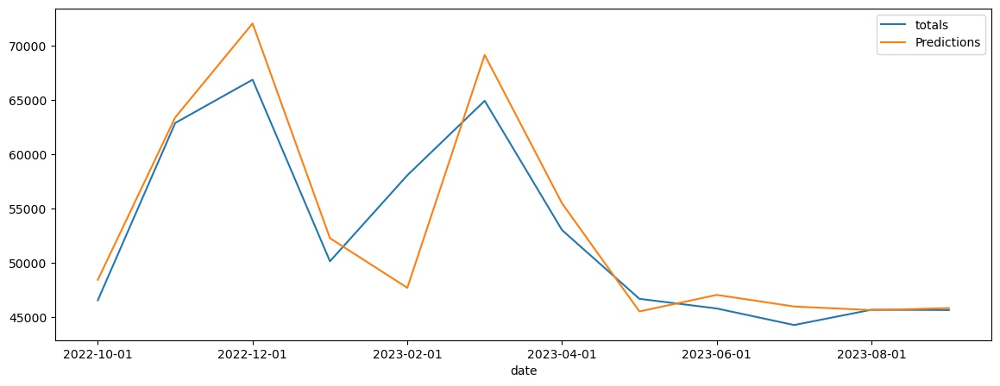

In [1025]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [1027]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Ohio', 'RMSE': rmse})

3791.6516991597355


## Oklahoma

<Axes: xlabel='date'>

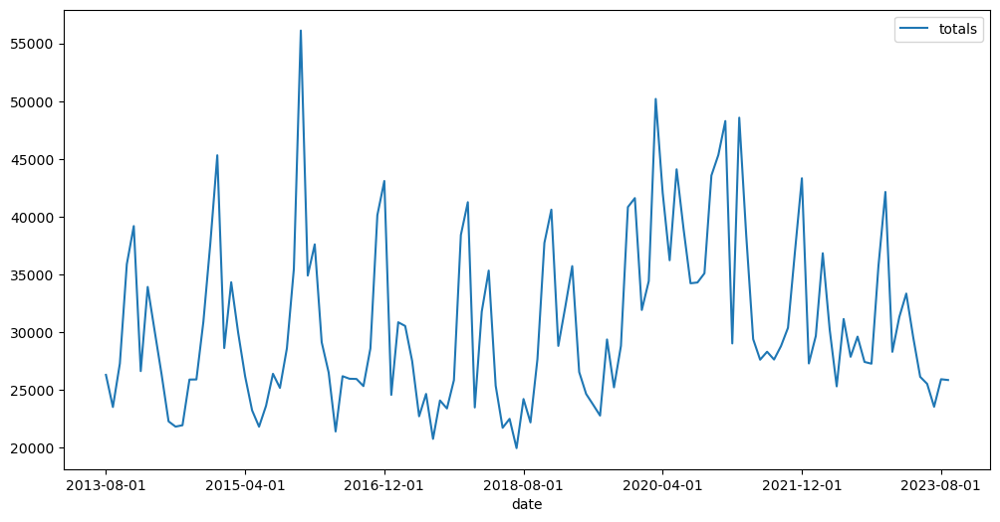

In [1030]:
df_f = df_all[df_all['state'] == 'Oklahoma']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [1032]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [1034]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [1036]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0598 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0494
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0285
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0361
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0360
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0473
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0253
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0310
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0215
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0220
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0361
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0606
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0461
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0287
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0208 
Epoch 16/100
9

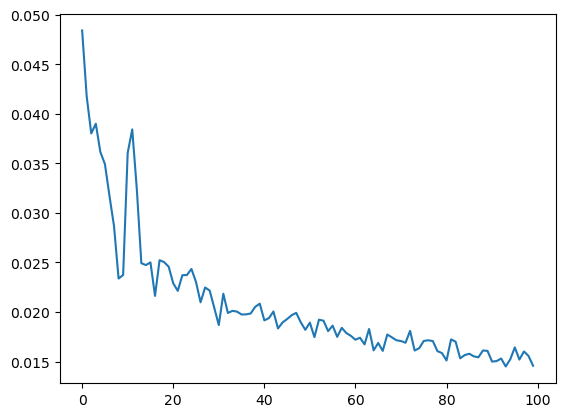

In [1038]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [1040]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


<Axes: xlabel='date'>

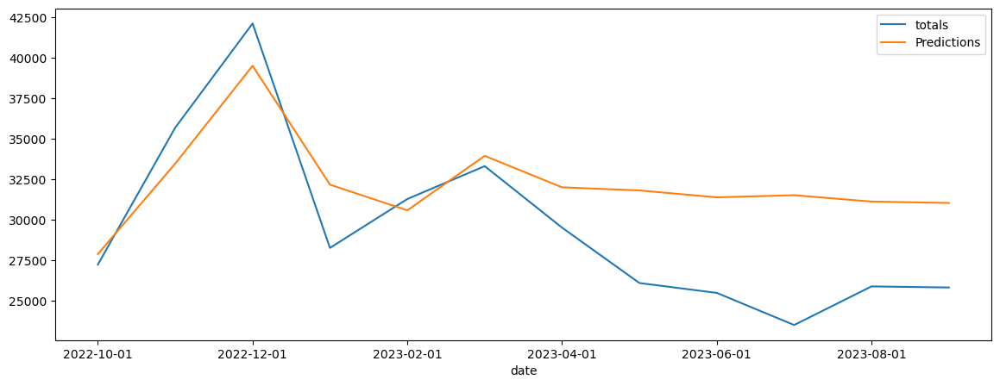

In [1042]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [1044]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Oklahoma', 'RMSE': rmse})

4288.912328279547


## Oregon

<Axes: xlabel='date'>

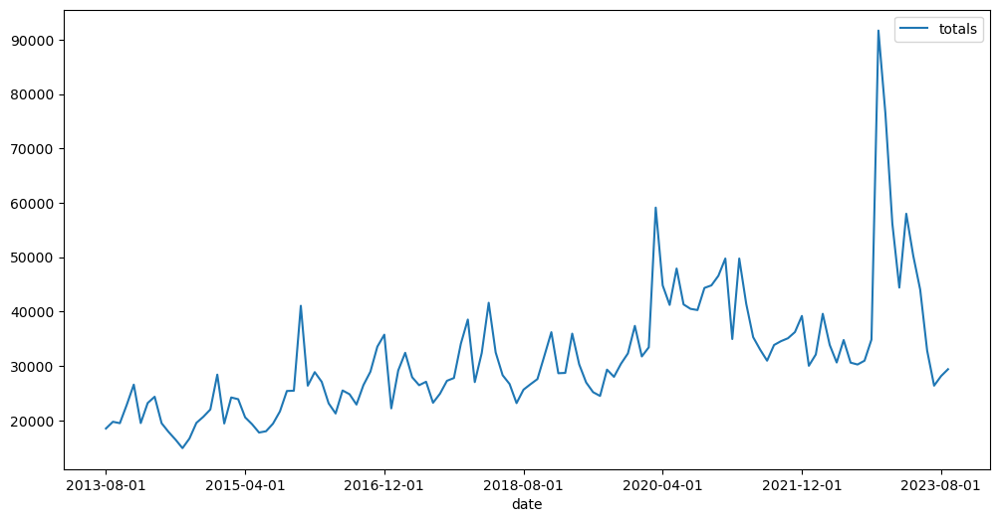

In [1047]:
df_f = df_all[df_all['state'] == 'Oregon']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [1049]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [1051]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [1053]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0583 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0236
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0222  
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0210
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0192  
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0173
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0138
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0176
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0172
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0092  
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0159
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0132  
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0099
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0098  
Epoch

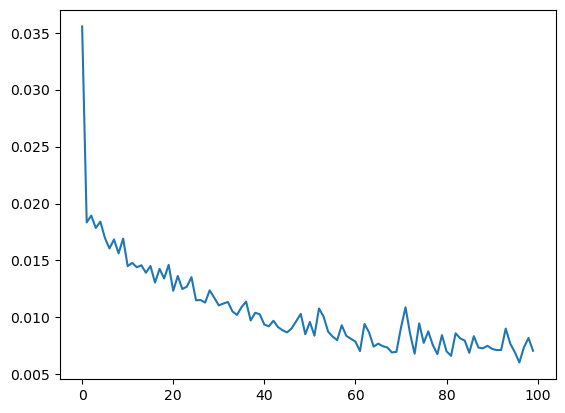

In [1055]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [1057]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


<Axes: xlabel='date'>

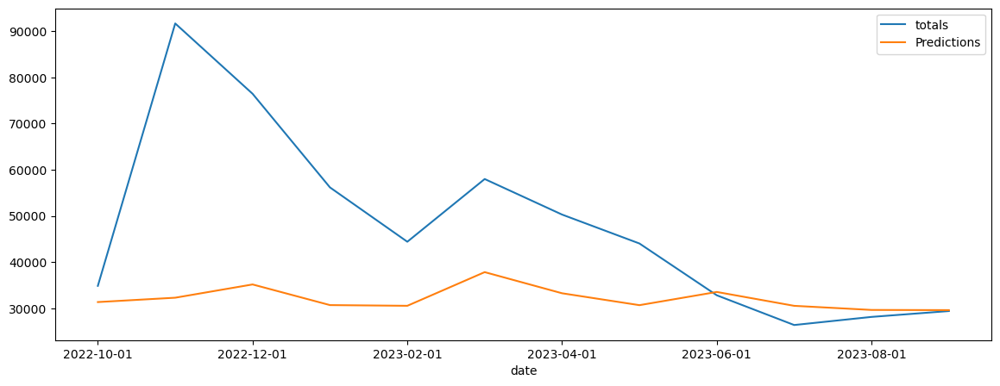

In [1059]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [1061]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Oregon', 'RMSE': rmse})

24109.932244219908


## Pennsylvania

<Axes: xlabel='date'>

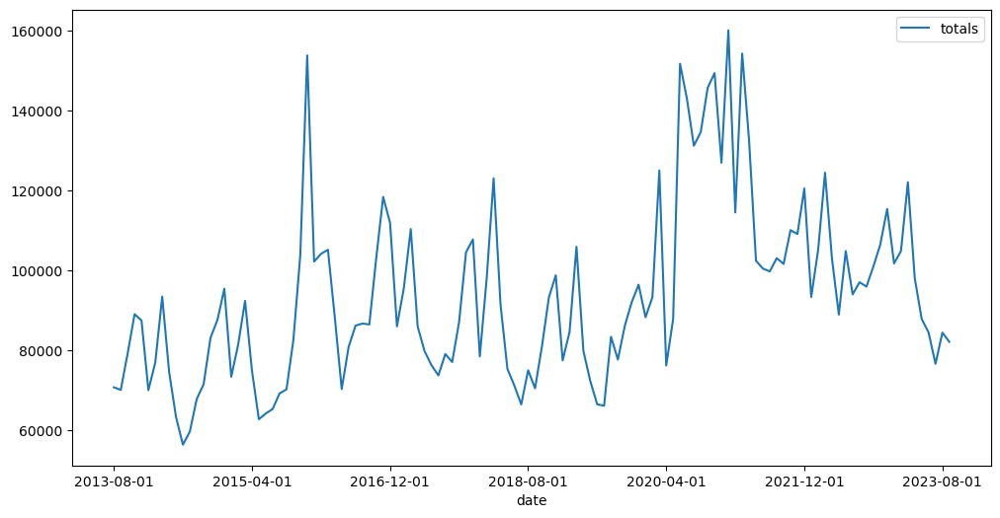

In [1064]:
df_f = df_all[df_all['state'] == 'Pennsylvania']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [1066]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [1068]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [1070]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0551 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0423
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0413
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0380
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0343
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0311
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0365
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0270
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0262
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0301
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0265
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0280
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0243
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0279
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0223
Epoch 16/100
98

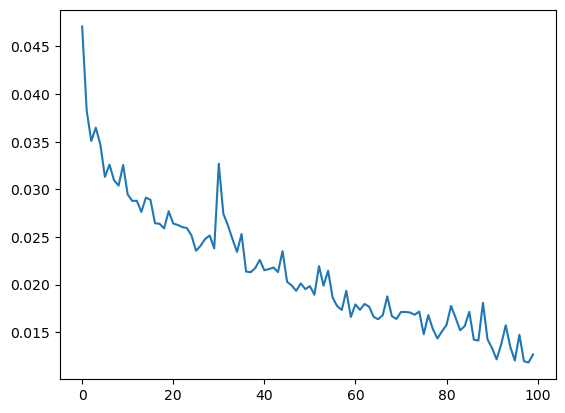

In [1072]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [1074]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


<Axes: xlabel='date'>

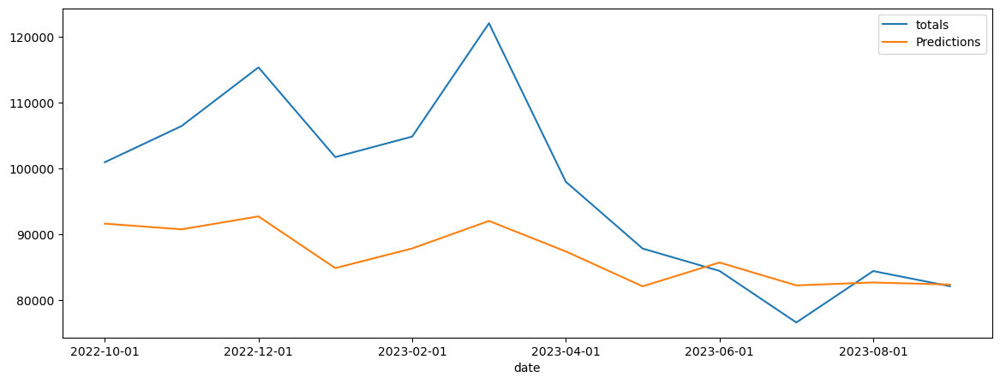

In [1076]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [1078]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Pennsylvania', 'RMSE': rmse})

14457.140920447076


## Rhode Island

<Axes: xlabel='date'>

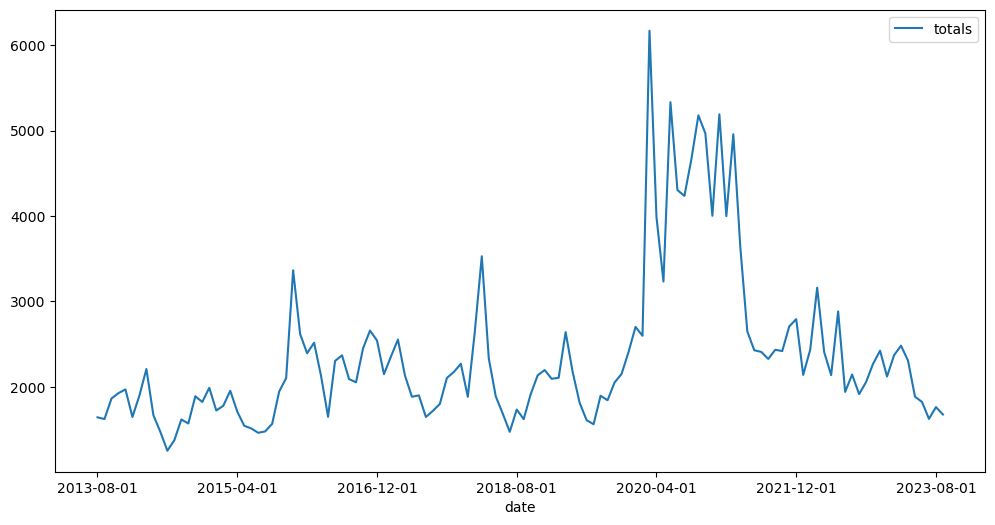

In [1081]:
df_f = df_all[df_all['state'] == 'Rhode Island']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [1083]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [1085]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [1087]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0402 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0257
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0190
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0135
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0182
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0111  
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0107
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0184
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136  
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0181
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0273  
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0131
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0141
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0218  
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0096
Epoch 1

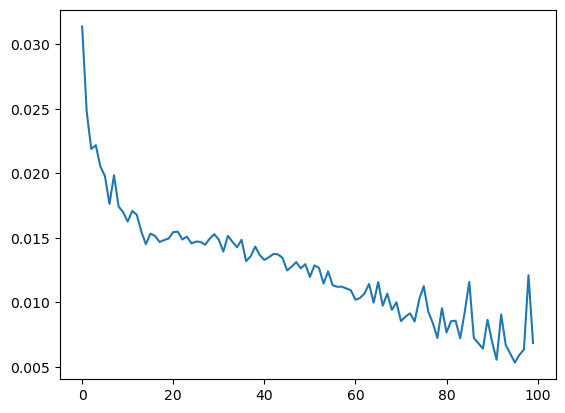

In [1089]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [1091]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


<Axes: xlabel='date'>

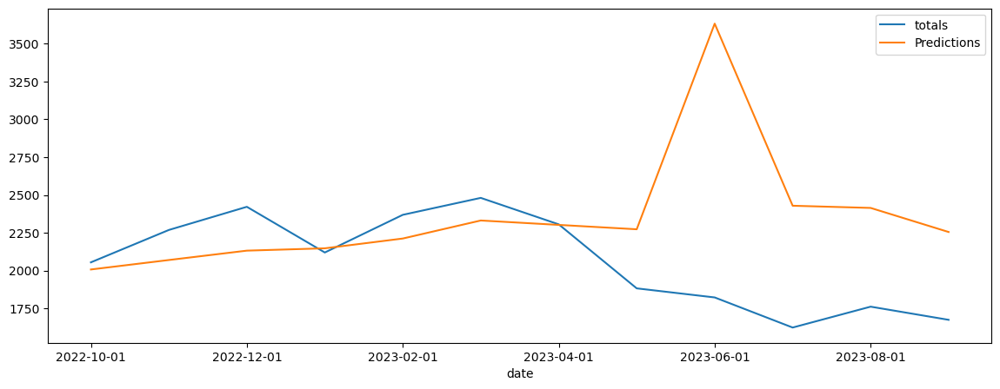

In [1093]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [1095]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Rhode Island', 'RMSE': rmse})

646.2400734832337


## South Carolina

<Axes: xlabel='date'>

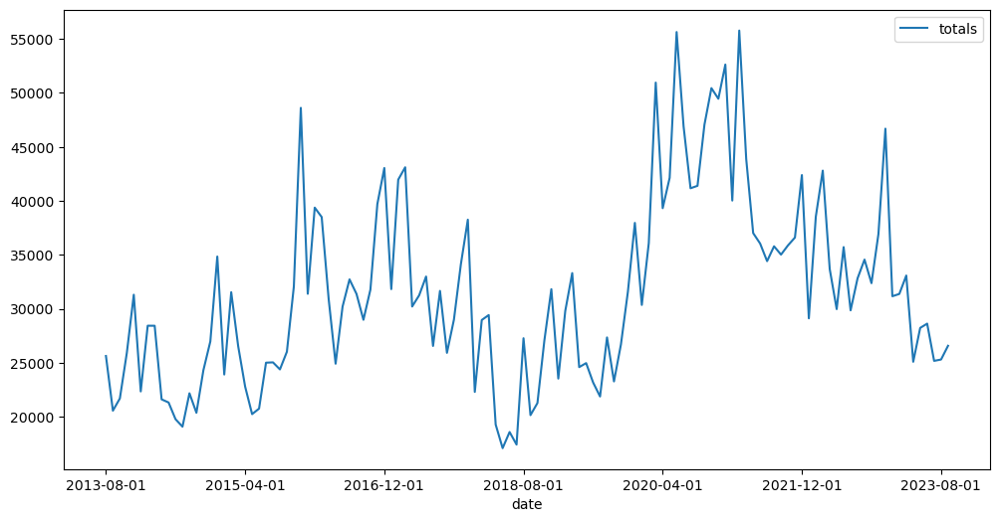

In [1098]:
df_f = df_all[df_all['state'] == 'South Carolina']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [1100]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [1102]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [1104]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0818
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0340
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0301
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0332
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0267
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0225
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0276
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0268
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0265
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0250
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0344
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0284
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0285
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0248
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0190
Epoch 16/100
98/

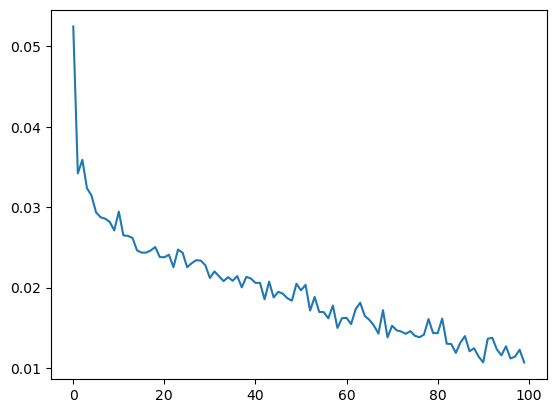

In [1106]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [1108]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


<Axes: xlabel='date'>

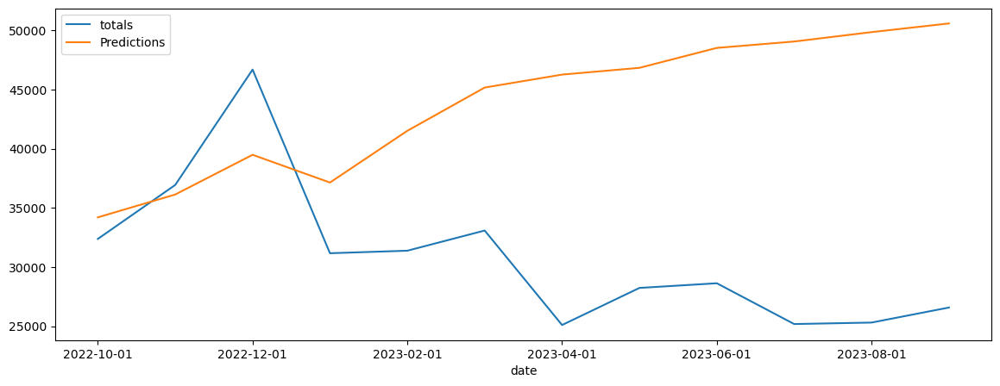

In [1110]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [1112]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'South Carolina', 'RMSE': rmse})

16525.35927510894


## South Dakota

<Axes: xlabel='date'>

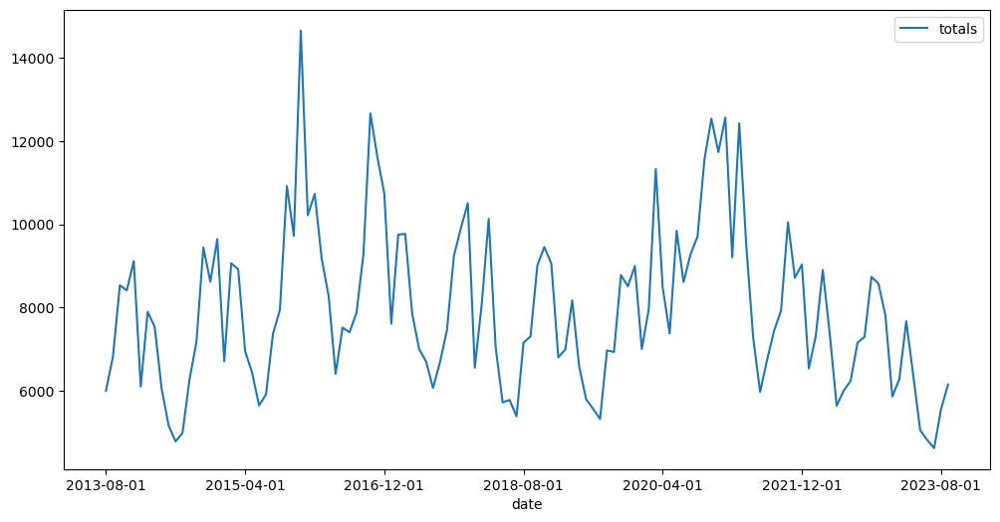

In [1115]:
df_f = df_all[df_all['state'] == 'South Dakota']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [1117]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [1119]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [1121]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0706
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0292
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0305
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0355
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0267
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0340
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0336
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0347
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0277
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0346
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0202  
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0213  
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0284
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0200
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0283
Epoch 16/100

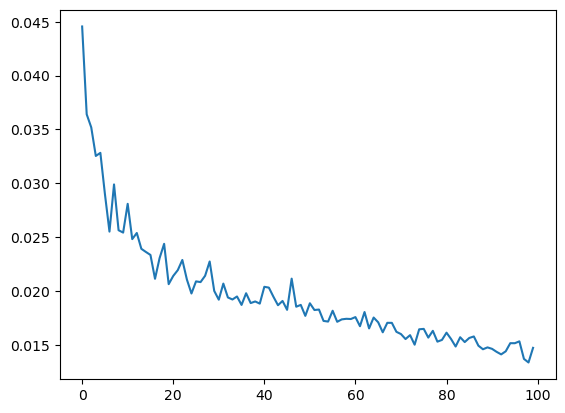

In [1123]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [1125]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


<Axes: xlabel='date'>

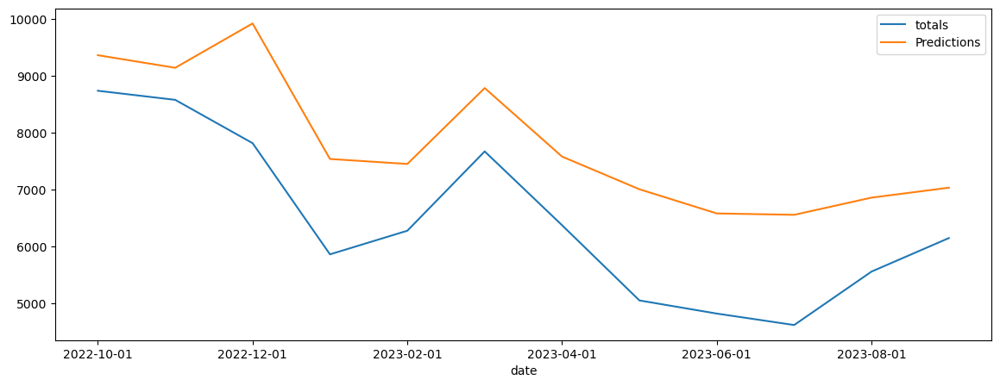

In [1127]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [1129]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'South Dakota', 'RMSE': rmse})

1447.6952009926456


## Tennessee

<Axes: xlabel='date'>

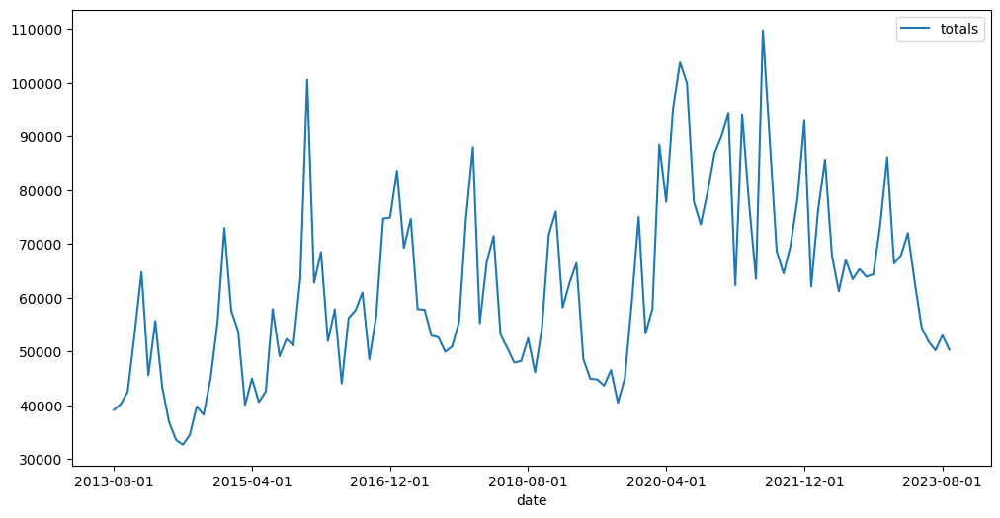

In [1132]:
df_f = df_all[df_all['state'] == 'Tennessee']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [1134]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [1136]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [1138]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1284 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0349
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0282
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0278
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0343
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0377
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 0.0368
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0308
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0343
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0329
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0376  
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0328
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0271  
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0321
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0270
Epoch 16/10

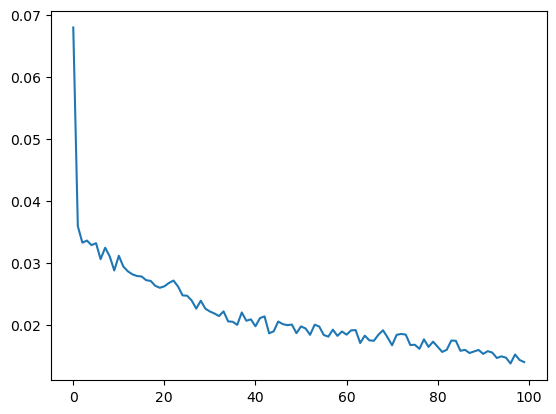

In [1140]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [1142]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


<Axes: xlabel='date'>

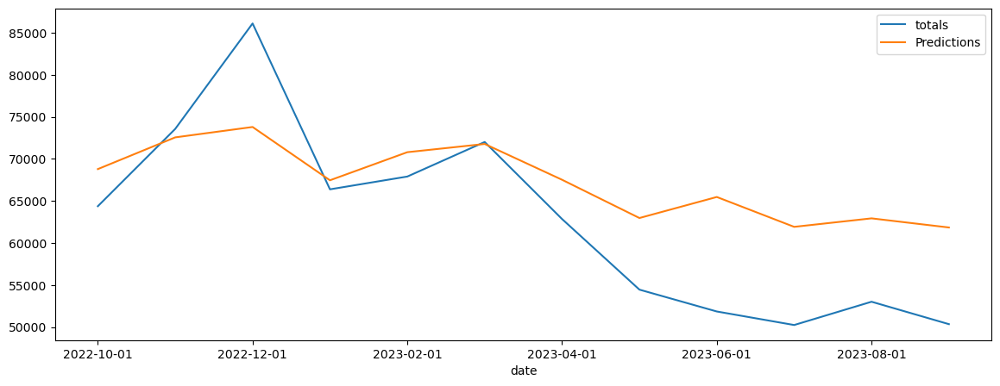

In [1144]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [1146]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Tennessee', 'RMSE': rmse})

8310.365845385068


## Texas

<Axes: xlabel='date'>

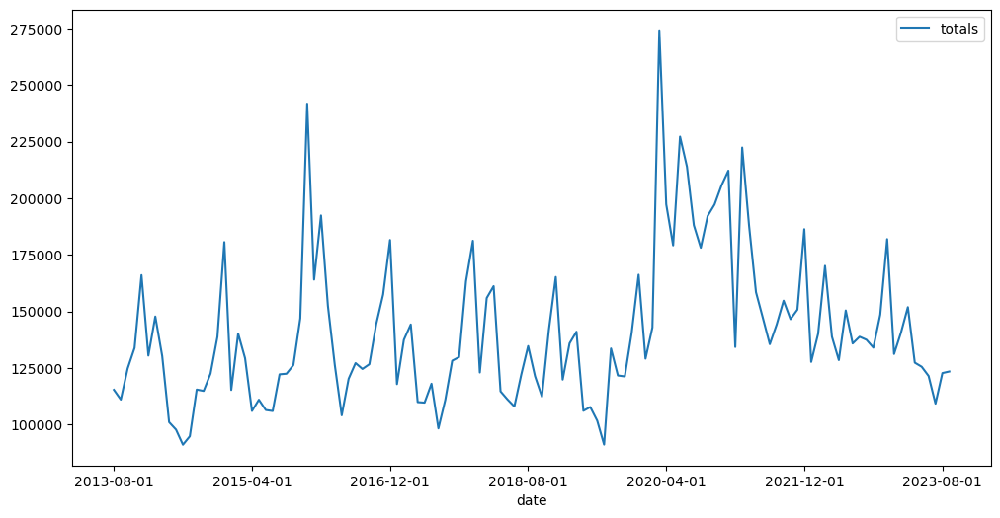

In [1149]:
df_f = df_all[df_all['state'] == 'Texas']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [1151]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [1153]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [1155]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0514
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0205
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0194  
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0243  
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0347  
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0226
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0204
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0250
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0247
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0238  
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0205
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0414
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0282
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0270
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0159
Epoch 16

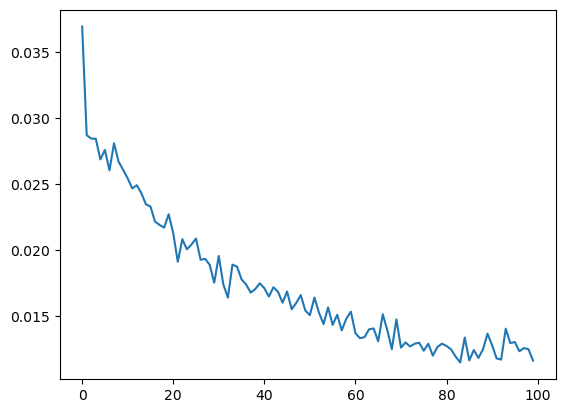

In [1157]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [1159]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step


<Axes: xlabel='date'>

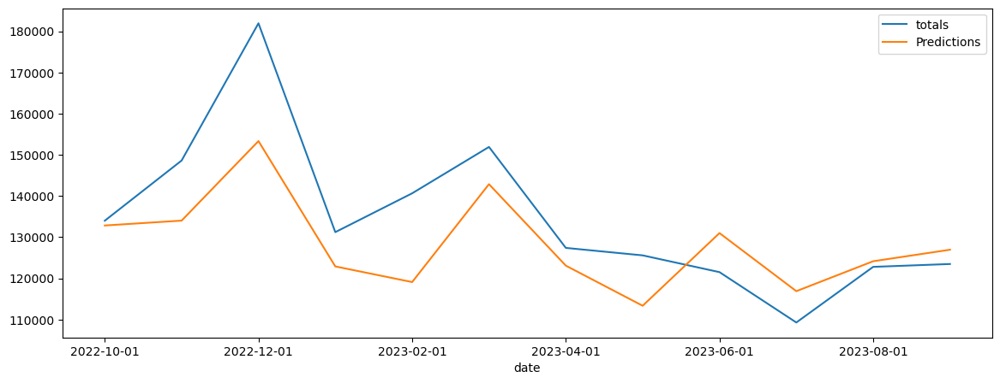

In [1161]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [1163]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Texas', 'RMSE': rmse})

12842.408728004555


## Utah

<Axes: xlabel='date'>

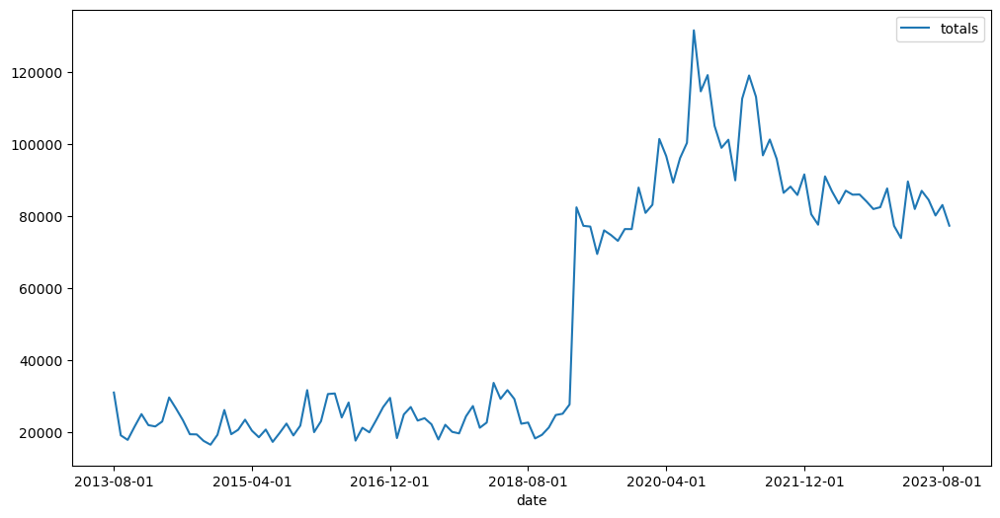

In [1166]:
df_f = df_all[df_all['state'] == 'Utah']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [1168]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [1170]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [1172]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0552 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0152
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0160  
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0118
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0172  
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0157  
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0084  
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0087
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0054
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0062
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0094
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0209
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0046  
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0054
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0086
Epoch

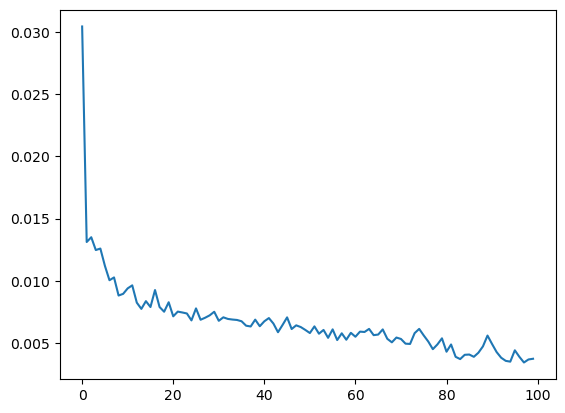

In [1174]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [1176]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


<Axes: xlabel='date'>

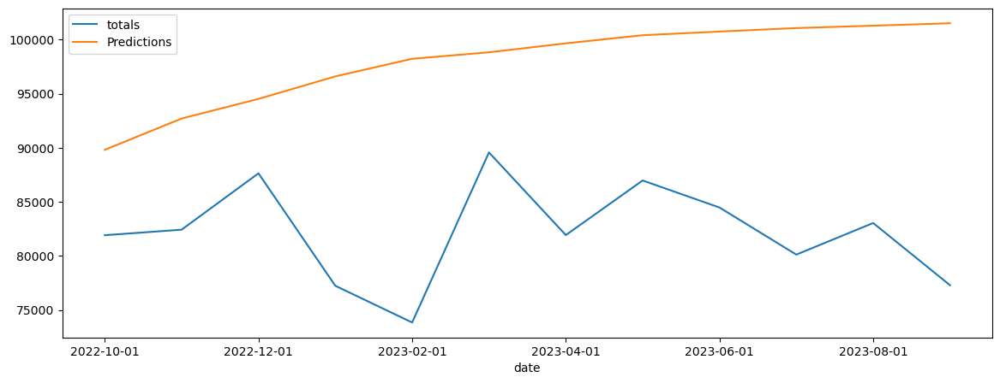

In [1178]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [1180]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Utah', 'RMSE': rmse})

16798.701665378103


## Vermont

<Axes: xlabel='date'>

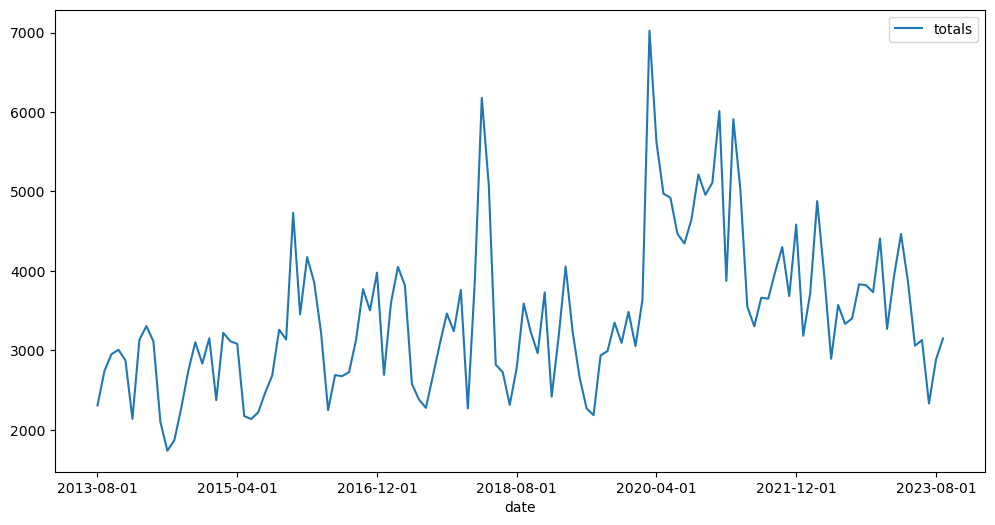

In [1183]:
df_f = df_all[df_all['state'] == 'Vermont']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [1185]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [1187]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [1189]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0610 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0311
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0335
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0266  
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0236
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0185  
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0249  
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0199
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0219
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0209
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0180
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0256  
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0235
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0370
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0264
Epoch 1

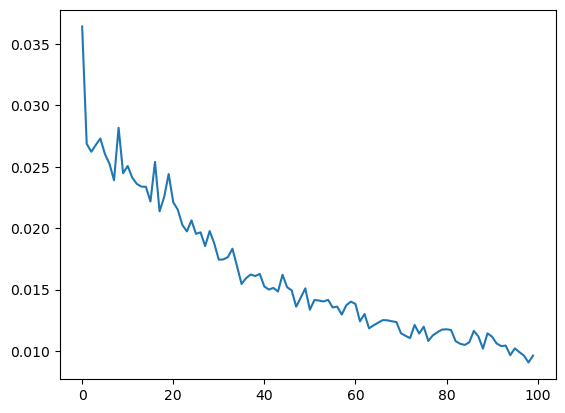

In [1191]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [1193]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


<Axes: xlabel='date'>

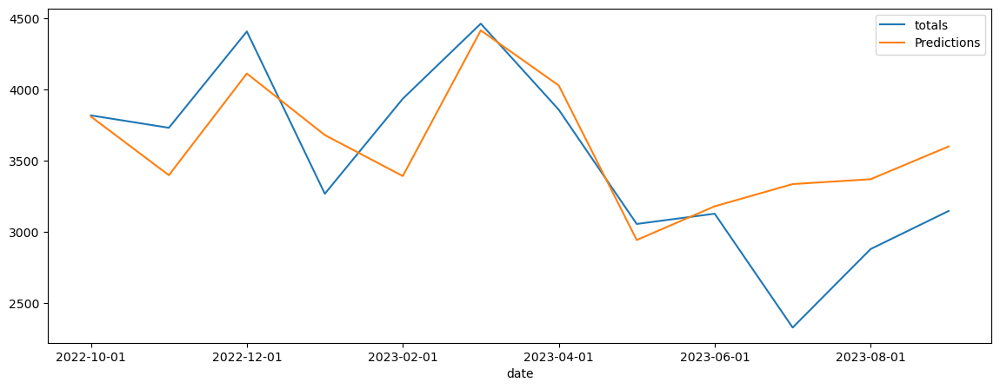

In [1195]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [1197]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Vermont', 'RMSE': rmse})

425.0422500212049


## Virginia

<Axes: xlabel='date'>

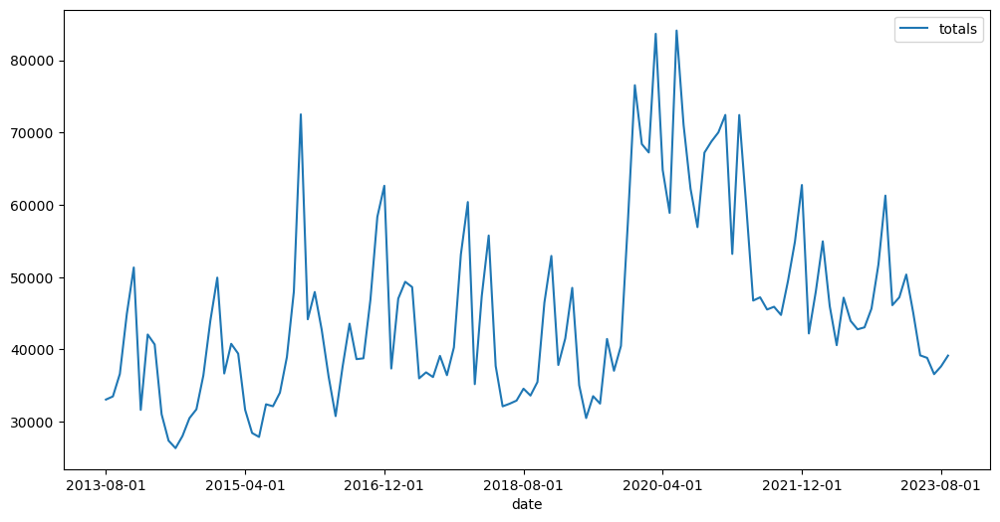

In [1200]:
df_f = df_all[df_all['state'] == 'Virginia']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [1202]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [1204]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [1206]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0423 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0393
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0265  
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0359
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0380
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0328
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0308
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0291
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0399
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0273
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0275
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0270
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0299
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0212
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0299
Epoch 16/100


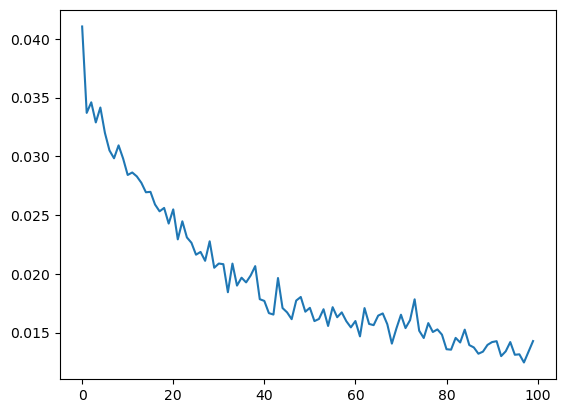

In [1208]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [1210]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


<Axes: xlabel='date'>

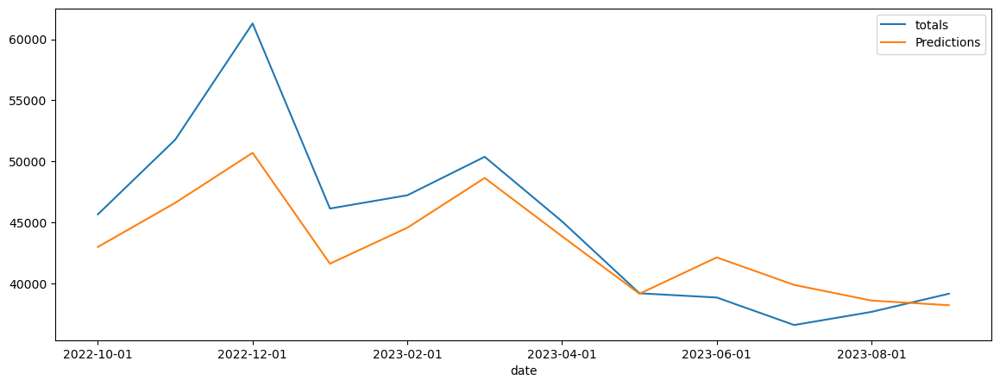

In [1212]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [1214]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Virginia', 'RMSE': rmse})

4097.386947556828


## Washington

<Axes: xlabel='date'>

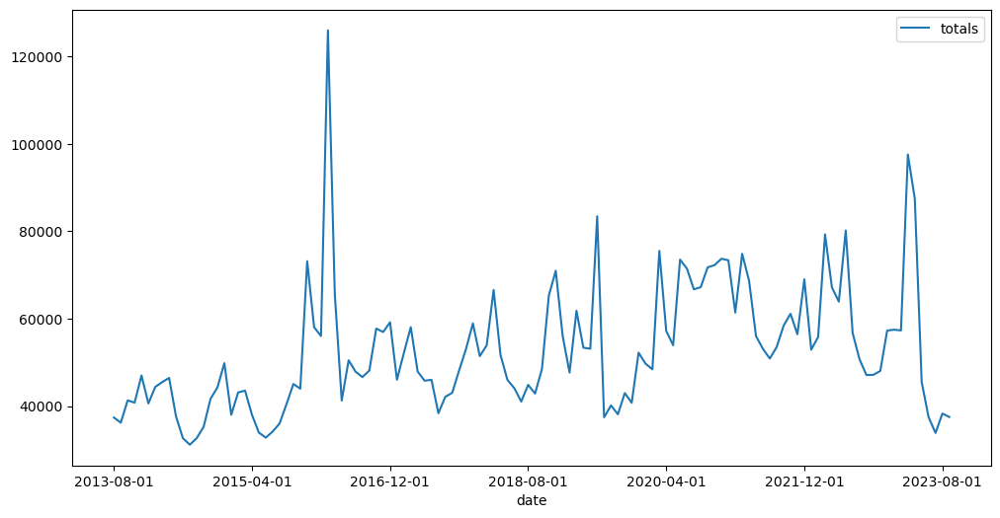

In [1217]:
df_f = df_all[df_all['state'] == 'Washington']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [1219]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [1221]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [1223]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0365 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0188
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0188
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0295
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0220
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0136
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0161
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0159
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0162  
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0182
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0336  
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0247
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0247  
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0121  
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0167
Epoch 1

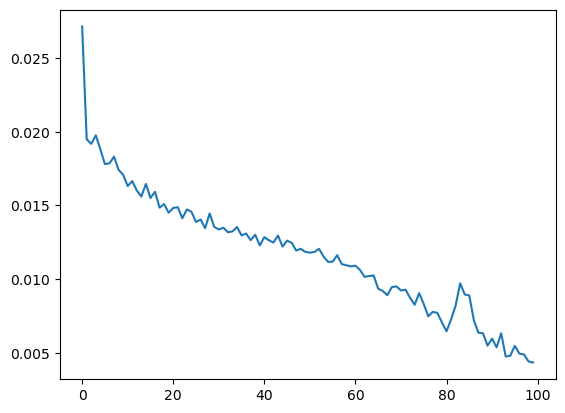

In [1225]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [1227]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


<Axes: xlabel='date'>

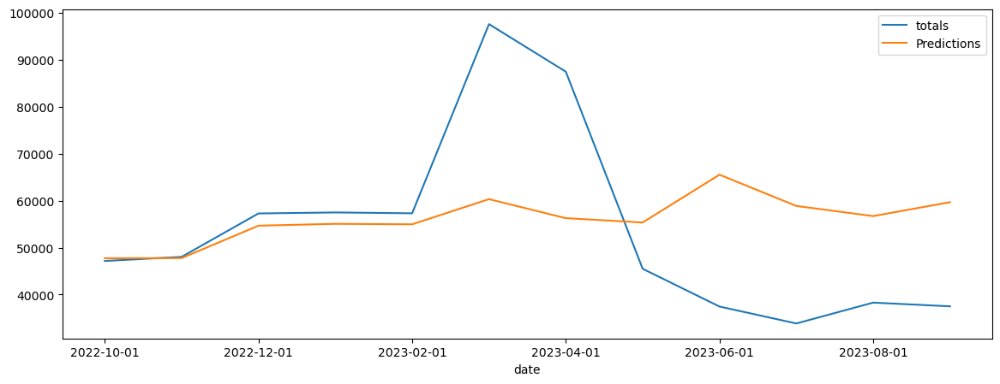

In [1229]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [1231]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Washington', 'RMSE': rmse})

19835.527455012496


## West Virginia

<Axes: xlabel='date'>

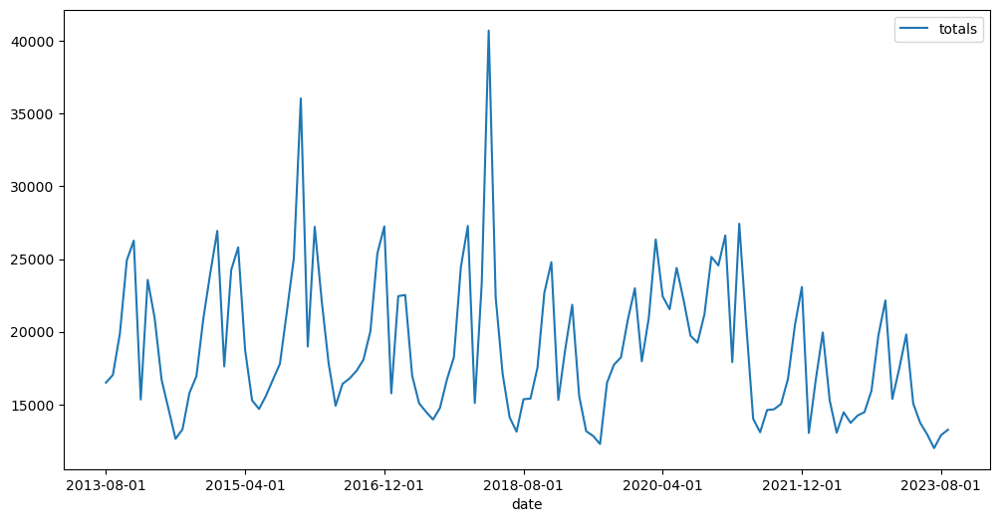

In [1234]:
df_f = df_all[df_all['state'] == 'West Virginia']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [1235]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [1238]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [1240]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0394 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0269
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0464
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0312  
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0251
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0279
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0270
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0369
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0192
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0270
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0298
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0213
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.1660
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0215
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0176
Epoch 16/100


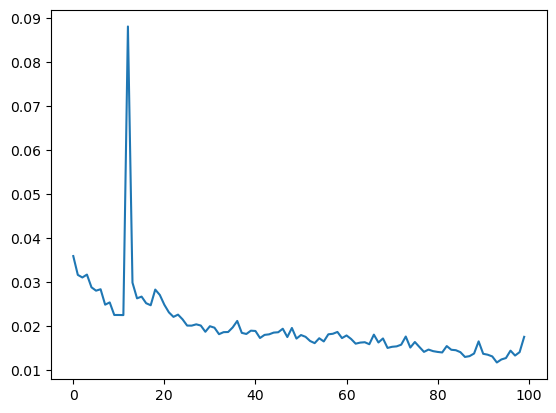

In [1242]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [1244]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


<Axes: xlabel='date'>

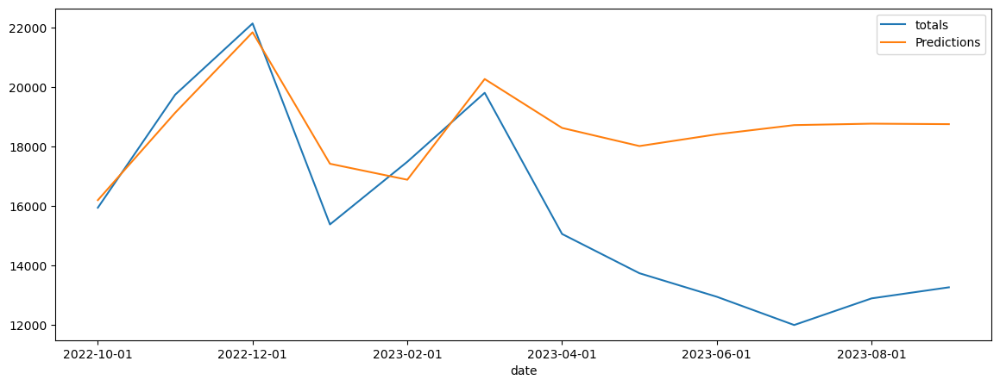

In [1246]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [1248]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'West Virginia', 'RMSE': rmse})

3831.6047612975594


## Wisconsin

<Axes: xlabel='date'>

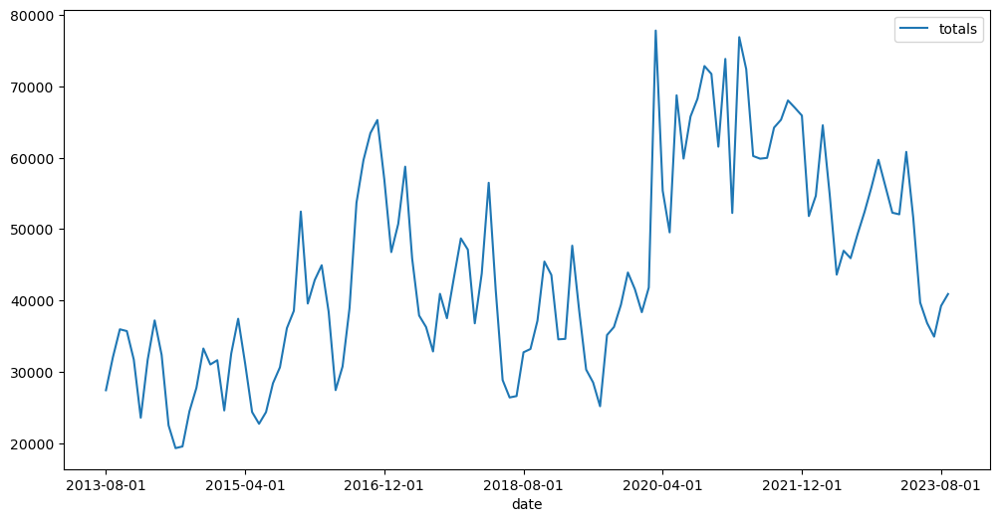

In [1251]:
df_f = df_all[df_all['state'] == 'Wisconsin']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [1253]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [1255]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [1257]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0859 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0292
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0302
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0298
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0229
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0293
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0283
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0324
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0256
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0336  
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0351
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0226
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0212
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0316
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0308
Epoch 16/100


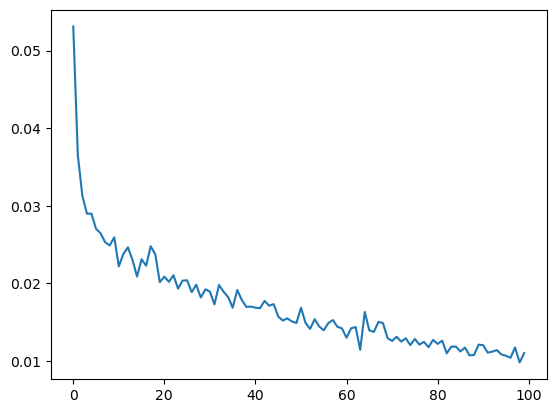

In [1259]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [1261]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step


<Axes: xlabel='date'>

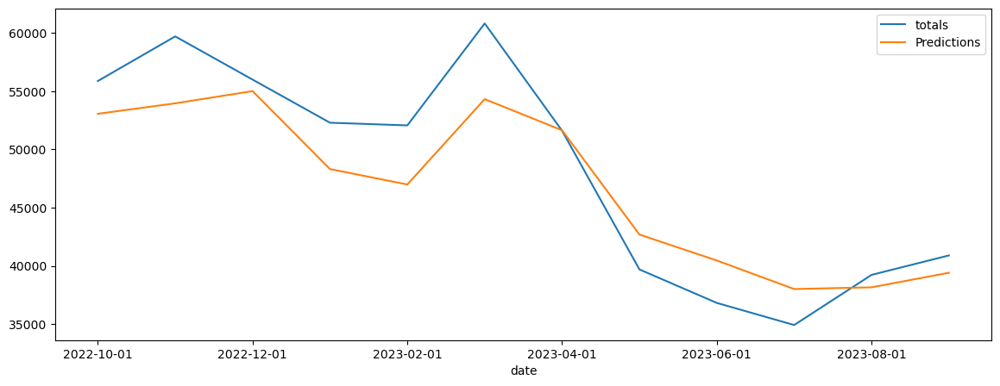

In [1263]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [1265]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Wisconsin', 'RMSE': rmse})

3660.864833083645


## Wyoming

<Axes: xlabel='date'>

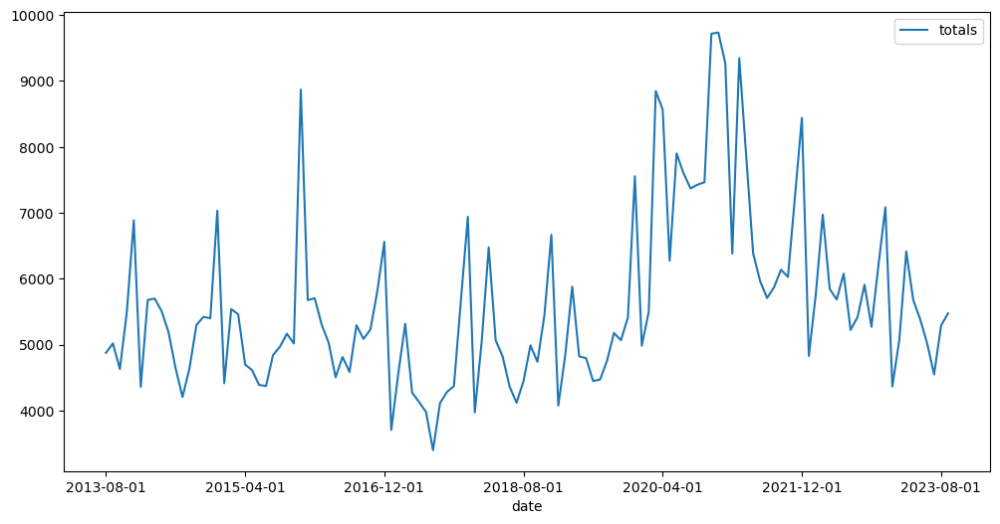

In [1268]:
df_f = df_all[df_all['state'] == 'Wyoming']
df = df_f[['date','totals']]
df = df.set_index('date')  # Set date as index
df.index.freq = 'MS'

df.plot(figsize=(12,6))

In [1270]:
train = df.iloc[:110]
test = df.iloc[110:]
scaler.fit(train)
scaled_train = scaler.transform(train)
scaled_test = scaler.transform(test)

In [1272]:
n_input = 12
generator = TimeseriesGenerator(scaled_train, scaled_train, length=n_input, batch_size=1)

model = Sequential()
model.add(Input(shape=(n_input, n_features)))  # Add Input layer first
model.add(LSTM(100, activation='relu'))        # Remove input_shape from LSTM
model.add(Dense(1))
model.compile(optimizer='adam', loss='mse')

In [1274]:
model.fit(generator,epochs=100)

Epoch 1/100


D:\Anaconda\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


98/98 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0907 
Epoch 2/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0424
Epoch 3/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0440
Epoch 4/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0275
Epoch 5/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0298  
Epoch 6/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0285
Epoch 7/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0338
Epoch 8/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0223
Epoch 9/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0390
Epoch 10/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0289
Epoch 11/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0264
Epoch 12/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0397
Epoch 13/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0340  
Epoch 14/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0220
Epoch 15/100
98/98 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0335
Epoch 16/10

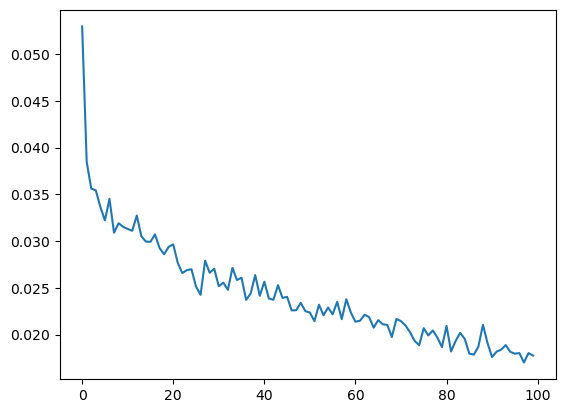

In [1276]:
loss_per_epoch = model.history.history['loss']
plt.plot(range(len(loss_per_epoch)),loss_per_epoch)

In [1278]:
test_predictions = []

first_eval_batch = scaled_train[-n_input:]
current_batch = first_eval_batch.reshape((1, n_input, n_features))

for i in range(len(test)):
    
    # get the prediction value for the first batch
    current_pred = model.predict(current_batch)[0]
    
    # append the prediction into the array
    test_predictions.append(current_pred) 
    
    # use the prediction to update the batch and remove the first value
    current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 111ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step


<Axes: xlabel='date'>

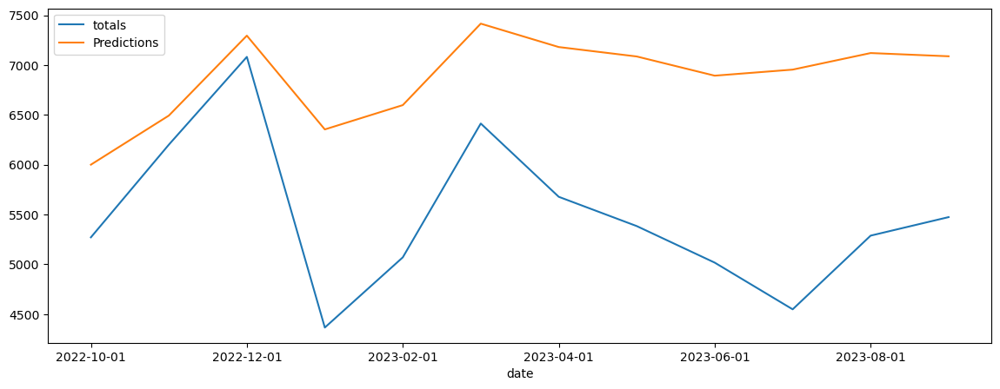

In [1280]:
true_predictions = scaler.inverse_transform(test_predictions)
test = test.assign(Predictions=true_predictions)

test.plot(figsize=(14,5))

In [1282]:
rmse=sqrt(mean_squared_error(test['totals'],test['Predictions']))
print(rmse)
rmse_data.append({'State': 'Wyoming', 'RMSE': rmse})

1538.922791041571


In [1288]:
rmse_data[10]['State'] = 'Georgia'

In [1296]:
rmse_df = pd.DataFrame(rmse_data)

In [1298]:
rmse_df['RMSE'] = rmse_df['RMSE'].round(3)

In [1300]:
rmse_df

,State,RMSE
0,Alabama,42205.824
1,Alaska,678.088
2,Arizona,6080.160
3,Arkansas,1937.960
4,California,11721.483
5,Colorado,5778.623
6,Connecticut,3921.666
7,Delware,1346.399
8,District of Columbia,392.958
9,Florida,15028.839


In [1302]:
rmse_df = rmse_df.sort_values('RMSE')
rmse_df

,State,RMSE
8,District of Columbia,392.958
45,Vermont,425.042
11,Hawaii,446.771
34,North Dakota,612.020
39,Rhode Island,646.240
19,Maine,647.334
27,Nebraska,659.765
1,Alaska,678.088
29,New Hampshire,703.484
16,Kansas,1017.329
